# Import libraries and load functions

In [1]:
import torch
import numpy as np
import time
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import cv2
import os
from skimage import img_as_bool, io, color, morphology
import math
from scipy import ndimage
from pytorch_msssim import ssim, ms_ssim, SSIM, MS_SSIM
import re
import pandas as pd
from PIL import Image
import random
from sklearn.model_selection import train_test_split
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.autograd import Variable

In [77]:
def scaled(d):
    a=d-d.min()
    b=d.max()-d.min()
    return np.divide(a, b, dtype="float32")#,out=np.zeros_like(a), where=b!=0)

def transcal(d):
    d = d.transpose(0,3,1,2)
    return scaled(d)

In [3]:
def reverse_scaled(d, original_min, original_max):
    return d * (original_max - original_min) + original_min

def reverse_transcal(d, original_min, original_max):
    # Reverse the scaling
    d = reverse_scaled(d, original_min, original_max)
    
    # Transpose the data back to the original shape
    d = d.transpose(0, 2, 3, 1)
    
    # Convert to uint8 (assuming the original images were in this format)
    d = d.astype(np.uint8)
    
    return d

In [4]:
def patches(img, channels=3):
    # Define parameters
    stride = 350 #510
    
    # Get image dimensions
    width, height = img.size
    
    # Calculate the number of patches needed for height and width
    num_patches_width = -(-width // stride)  # Round up
    num_patches_height = -(-height // stride)  # Round up
    
    # Calculate maximum height and width required
    max_width = num_patches_width * stride
    max_height = num_patches_height * stride
    
    # Create a padded image with the specified number of channels
    padded_img = np.zeros((max_height, max_width, channels), dtype=np.uint8)
    img_array = np.array(img)
    
    # Handle grayscale images by expanding dimensions
    if img_array.ndim == 2:  # Grayscale image
        img_array = np.expand_dims(img_array, axis=2)  # Convert to (height, width, 1)
        print(f"Grayscale image converted to shape: {img_array.shape}")
    
    # Assign the original image to the top-left corner of the padded image
    padded_img[:height, :width, :] = img_array
    
    # Extract patches using list comprehension
    patches_array = np.array([
        np.array(Image.fromarray(padded_img[y:y+stride, x:x+stride, :].squeeze()).resize((310, 310)))
        for y in range(0, max_height, stride)
        for x in range(0, max_width, stride)
    ])
    
    return patches_array

In [5]:
def reconstruct_image(patches_array, original_size):
    # Define parameters
    patch_size = 350 #510
    
    # Get original image dimensions
    width, height = original_size
    
    # Calculate number of patches needed for height and width
    num_patches_width = -(-width // patch_size)  # Round up
    num_patches_height = -(-height // patch_size)  # Round up
    
    # Calculate maximum height and width required
    max_width = num_patches_width * patch_size
    max_height = num_patches_height * patch_size
    
    # Initialize array to store reconstructed image
    reconstructed_img = np.zeros((max_height, max_width, 3), dtype=np.uint8)
    
    # Initialize variables to keep track of patch position
    patch_index = 0
    
    # Assemble patches into the reconstructed image
    for y in range(0, max_height, patch_size):
        for x in range(0, max_width, patch_size):
            # Get the current patch and resize it back to 500x500
            patch = Image.fromarray(patches_array[patch_index]).resize((patch_size, patch_size))
            patch = np.array(patch)
            
            # Calculate coordinates for placing the patch
            x_end = x + patch_size
            y_end = y + patch_size
            
            # Place the patch into the reconstructed image
            reconstructed_img[y:y_end, x:x_end, :] = patch
            
            # Increment patch index
            patch_index += 1
            
            # Check if we've reached the end of the patches
            if patch_index >= len(patches_array):
                break
        if patch_index >= len(patches_array):
            break
    
    # Crop the reconstructed image to the original size
    reconstructed_img = reconstructed_img[:height, :width, :]
    
    # Convert reconstructed image to PIL Image
    reconstructed_img_pil = Image.fromarray(reconstructed_img)
    
    return reconstructed_img_pil

In [6]:
def extract_and_reconstruct_all(patches_dataset, original_size):
    """
    This function extracts patches from a dataset and reconstructs the original images.
    
    :param patches_dataset: numpy array of shape (N, 320, 320, 3)
    :param original_size: tuple containing the original (width, height) of the images
    :return: list of reconstructed PIL Images
    """
    # Number of patches per image (assumed to be 25 for each original image)
    patches_per_image = 56
    
    # Initialize list to store reconstructed images
    reconstructed_images = []
    
    # Iterate over the dataset in chunks of 25 patches
    num_images = len(patches_dataset) // patches_per_image
    for i in range(num_images):
        # Extract patches for the current image
        start_index = i * patches_per_image
        end_index = (i + 1) * patches_per_image
        patches_for_image = patches_dataset[start_index:end_index]
        
        # Reconstruct the image using the patches
        reconstructed_image = reconstruct_image(patches_for_image, original_size)
        
        # Append the reconstructed image to the list
        reconstructed_images.append(reconstructed_image)
    
    return reconstructed_images

In [7]:
def random_seed(seed_value, use_cuda):
    np.random.seed(seed_value) # cpu vars
    torch.manual_seed(seed_value) # cpu  vars
    random.seed(seed_value) # Python
    if use_cuda: 
        torch.cuda.manual_seed(seed_value)
        torch.cuda.manual_seed_all(seed_value) # gpu vars
        torch.backends.cudnn.deterministic = True  #needed
        torch.backends.cudnn.benchmark = False

In [8]:
random_seed(88,True)
torch.cuda.FloatTensor(10,10)

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], device='cuda:0')

## Load data

In [9]:
dir0 = "natural_forest_2023_Jan/4train/"
l = os.listdir(dir0)
l[0]

'AN10 2.tiff'

In [10]:
# Images
X = np.zeros(shape=(1,310,310,3), dtype="uint8")
for i in l:
    try:
        img = Image.open(dir0+i)
        I = patches(img)
        x=np.array(I)
        X = np.append(X, x, axis=0)
    except: 
        print("No")
X = X[1:]
X.shape    

(1848, 310, 310, 3)

In [11]:
def apply_clahe_to_batch(X):
    """
    Applies CLAHE on the L channel of LAB color space for a batch of RGB images.

    Parameters:
        X (np.ndarray): Input array of shape (N, H, W, 3), with RGB images.

    Returns:
        np.ndarray: CLAHE-enhanced images of the same shape.
    """
    X_cl = np.empty_like(X)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

    for i in range(X.shape[0]):
        image = X[i]
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        cl = clahe.apply(l)
        lab_clahe = cv2.merge((cl, a, b))
        image_clahe = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB)
        X_cl[i] = image_clahe

    return X_cl

In [12]:
X = apply_clahe_to_batch(X)

In [13]:
dir1 = "natural_forest_2023_Jan/4train_masks/"
l = os.listdir(dir1)
l[0]

'AN10 2_mask.png'

In [14]:
# Masks
Y = np.zeros(shape=(1,310,310,1), dtype="uint8")
for i in l:
    img = Image.open(dir1+i)
    #img_array = np.array(img) 
    #img_array = np.expand_dims(img_array, axis=2)
    I = patches(img,1)
    y=np.array(I)
    y = np.expand_dims(y, axis=3)
    Y = np.append(Y, y, axis=0)

Y = Y[1:]
Y.shape

Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale image converted to shape: (2273, 2550, 1)
Grayscale im

(1848, 310, 310, 1)

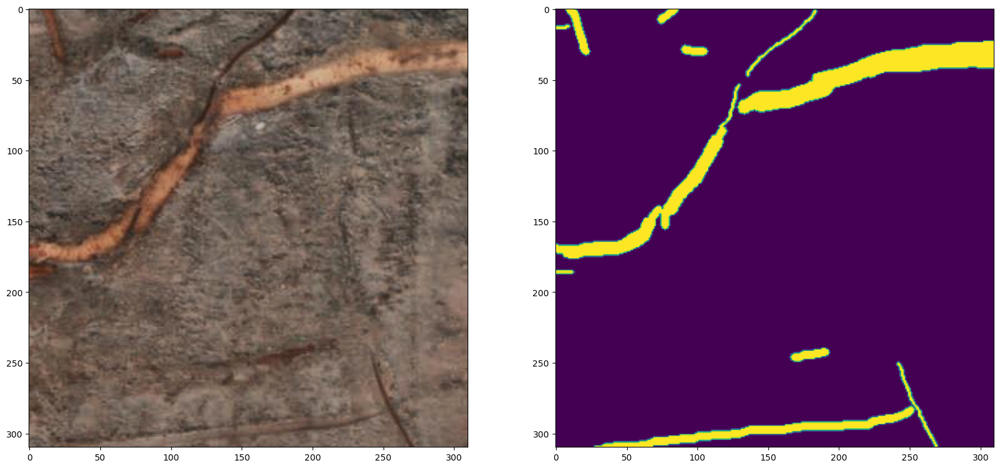

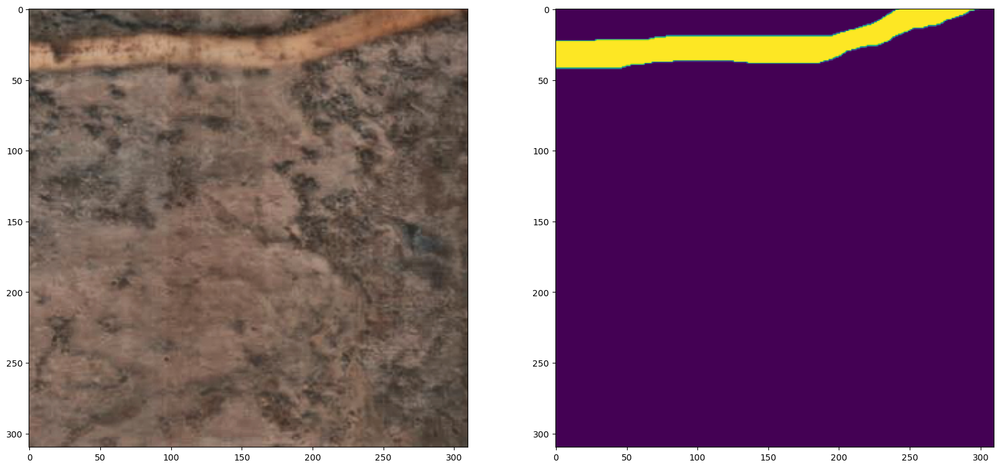

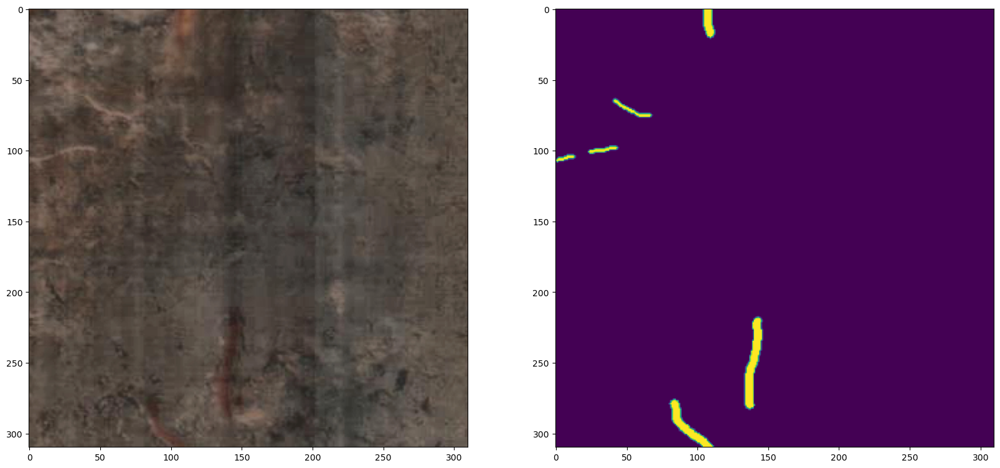

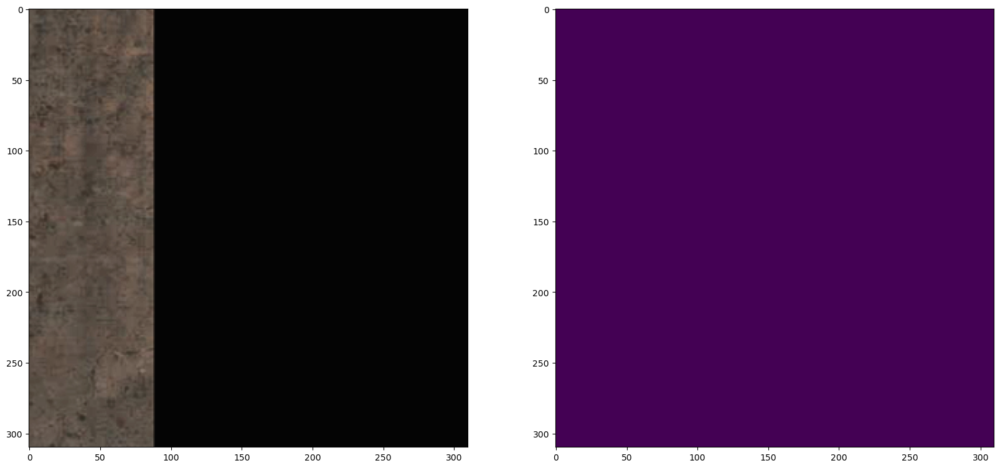

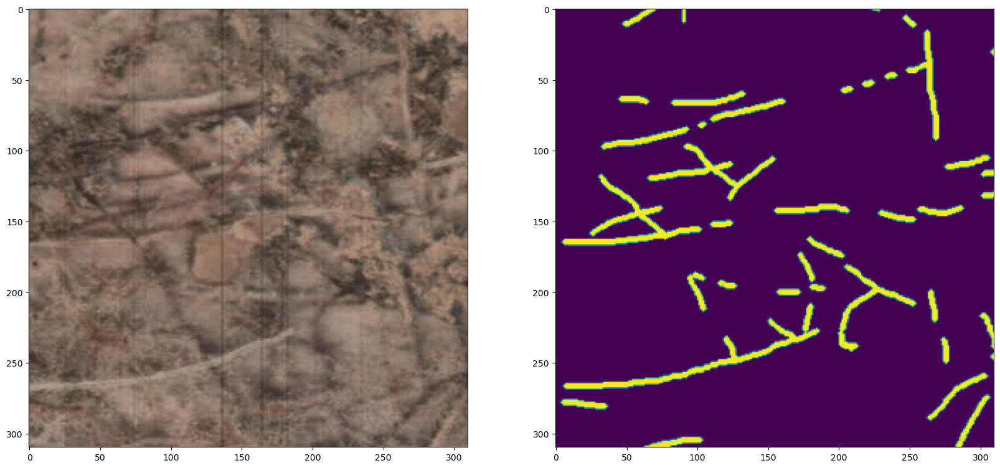

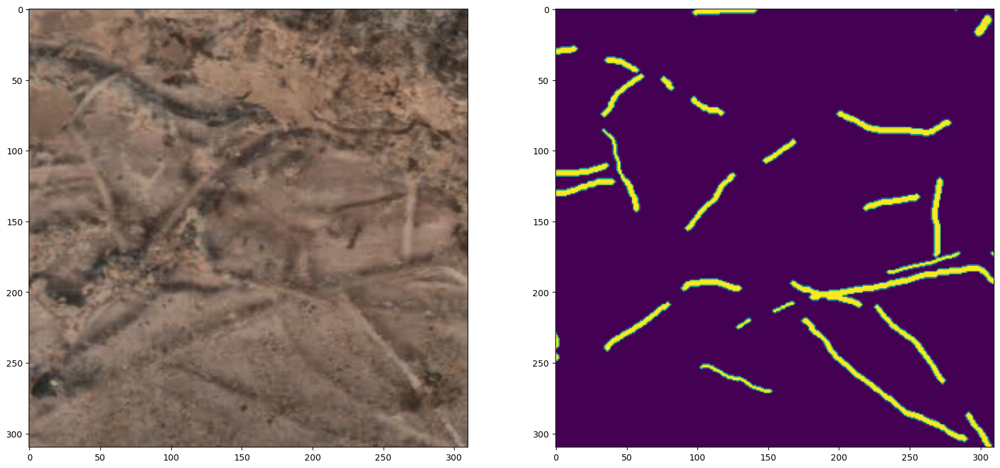

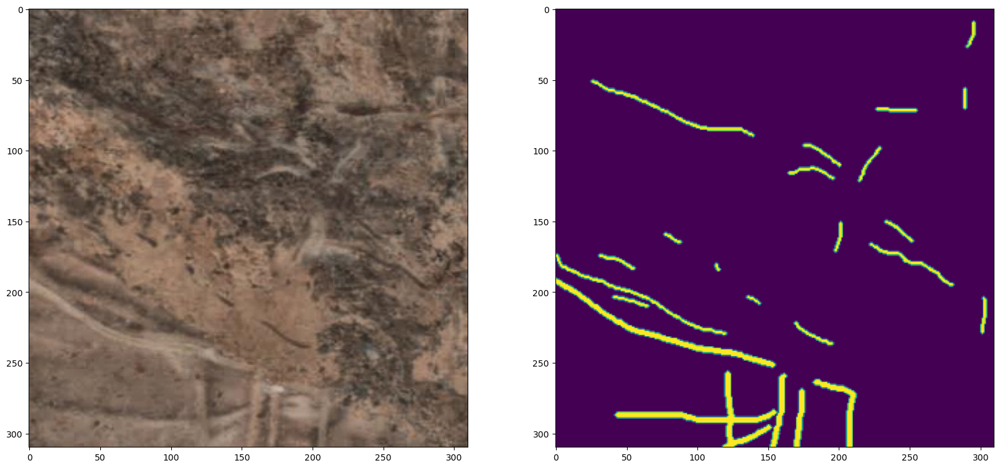

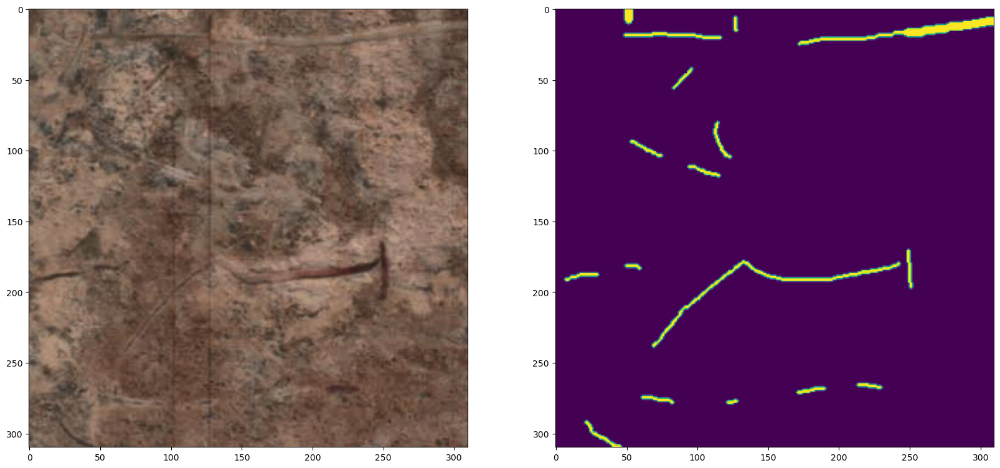

In [15]:
# Check
for i in range(252,260):
    figure(figsize=(20,20))
    plt.subplot(1, 2, 1)
    plt.imshow(X[i])
    plt.subplot(1, 2, 2)
    plt.imshow(Y[i])

In [16]:
X = transcal(X)
X.shape

(1848, 3, 310, 310)

In [17]:
Y = transcal(Y)
Y.shape

(1848, 1, 310, 310)

In [18]:
def scaled(d):
    a=d-d.min()
    b=d.max()-d.min()
    return np.divide(a, b, dtype="float32",out=np.zeros_like(a), where=b!=0)

## Pre-training mask

Using pre-trained model to predict roots and summing the generated mask to manual labels.

In [19]:
model = torch.load("./EModel2")

C:\ProgramData\Anaconda3\envs\Image_processing\lib\site-packages\torchvision\io\image.py:11: UserWarning: Failed to load image Python extension: [WinError 126] The specified module could not be found
  warn(f"Failed to load image Python extension: {e}")


In [20]:
def pad_with(vector, pad_width, iaxis, kwargs):
    pad_value = kwargs.get('padder', 10)
    vector[:pad_width[0]] = pad_value
    vector[-pad_width[1]:] = pad_value
    
def padding(dat,n="y"):
    m = []
    for i in range(dat.shape[0]):
        if n=="y":
            m.append(np.pad(dat[i,0], 5, pad_with, padder=0))
        else:
            n = []
            for j in range(3):
                n.append(np.pad(dat[i,j], 5, pad_with, padder=0))
            m.append(n)   
    return np.array(m)

In [21]:
X_ = padding(X.copy(), "x")
X_.shape

(1848, 3, 320, 320)

In [22]:
Y_ = padding(Y.copy())
Y_ = np.expand_dims(Y_,axis=3)
Y_ = Y_.transpose(0,3,1,2)
Y_.shape

(1848, 1, 320, 320)

In [23]:
def predicting_mask(x,mod):
    out=torch.tensor([])
    for i in range(0,x.shape[0],1):
        torch.cuda.empty_cache() 
        j=i+1
        if j==(x.shape[0]+1):
            with torch.no_grad():
                outputs = mod(torch.from_numpy(x[i:]).cuda()) 
            out = torch.cat((out,outputs.cpu()),0)
        else:
            with torch.no_grad():
                outputs = mod(torch.from_numpy(x[i:j]).cuda()) 
            out = torch.cat((out,outputs.cpu()),0)

    return out.cpu().detach().numpy() 

kernel = np.ones((2, 2), np.float32)
def summing_masks(original, predicted, v=False):
    y=[]
    for i in range(original.shape[0]):
        if v==False:
            m = original[i]+predicted[i]
            m = cv2.erode(m,kernel)
        else:
            m = (original[i]>0.3)+predicted[i]
            m = cv2.erode(m,kernel) #new!!!!!!!!!!!!!!!!!!!!!!!!!!!
        #m = np.concatenate((m[0], np.zeros((320, 10),dtype="float32")), axis=1)
        #m = np.expand_dims(m,axis=0)
        m = np.round(m > 0.5)
        m = scaled(m)
        #m[:,:,310:320] = np.zeros(( 320, line_width),dtype="float32")
        m = cv2.GaussianBlur(Y[i],(5,5),0)
        y.append(m)
    return np.array(y)

In [24]:
new_y=predicting_mask(X_,model)

In [25]:
new_y=summing_masks(Y_,new_y,True)

In [21]:
Y_.dtype

dtype('float32')

Different approach from summing masks, only small objects erosion and Gaussian Blur of the masks, to create levels of certainty, which shows a better results than a regular mask with 0 and 1 only.

In [20]:
# Adding gaussian blur to the image
y=[]
kernel = np.ones((2, 2), np.float32)
for i in range(Y.shape[0]):
    m = cv2.erode(Y[i],kernel)
    m = cv2.GaussianBlur(Y[i],(5,5),0)
    y.append(m)

new_y = np.array(y)

#new_y = Y

In [21]:
new_y.dtype

dtype('float32')

Resulted new_y

In [31]:
new_y.shape

(1848, 1, 310, 310)

In [32]:
new_y = new_y.astype(np.float32)

In [33]:
new_y.max()

1.0

## Train val split and image augmentation

In [40]:
# Y or new_y
X_train, xval, Y_train, yval = train_test_split(
    X, new_y, test_size=0.1, random_state=9, shuffle=True) #new_y

In [41]:
yval.shape

(185, 1, 310, 310)

In [42]:
X_train.shape

(1663, 3, 310, 310)

Image augmentation by mirroring and roatating 90 degrees, this augment the data by 3-folds.

In [43]:
S = X_train.shape[0]

for i in range(4):  # We need 4 transformations
    print(i)
    for j in range(S):
        
        if i == 0:  # Mirror flip + inverse color
            break
            #n = np.flip(X_train[j], axis=1)
            #n = cv2.bitwise_not(n)
            #m = np.flip(Y_train[j], axis=1)
        elif i == 1:  # mirror flip
            
            n = np.flip(X_train[j], axis=1)
            m = np.flip(Y_train[j], axis=1)
        elif i == 2:  # Rotate 90 degrees
            
            n = np.rot90(X_train[j], 2)
            m = np.rot90(Y_train[j], 2)
        elif i == 3:  # Rotate 270 degrees + inverse color
            break
            #n = np.rot90(X_train[j], 3)
            #n = cv2.bitwise_not(n)
            #m = np.rot90(Y_train[j], 3)
        
        n = np.expand_dims(n, axis=0)
        m = np.expand_dims(m, axis=0)
        X_train = np.append(X_train, n, axis=0)
        Y_train = np.append(Y_train, m, axis=0)

            
            

0
1
2
3


In [44]:
X_train.shape

(4989, 3, 310, 310)

In [46]:
Y_train.dtype

dtype('float32')

### Padding

Additional padding is added to avoid prediction on borders of the image, experienced in a previous trainings.

In [47]:
def pad_with(vector, pad_width, iaxis, kwargs):
    pad_value = kwargs.get('padder', 10)
    vector[:pad_width[0]] = pad_value
    vector[-pad_width[1]:] = pad_value
    
def padding(dat,n="y"):
    m = []
    for i in range(dat.shape[0]):
        if n=="y":
            m.append(np.pad(dat[i,0], 5, pad_with, padder=0))
        else:
            n = []
            for j in range(3):
                n.append(np.pad(dat[i,j], 5, pad_with, padder=0))
            m.append(n)   
    return np.array(m)

In [48]:
xval = padding(xval, "x")


In [49]:
Y = padding(yval)
Y = np.expand_dims(Y,axis=3)
yval = Y.transpose(0,3,1,2)
yval.shape

(185, 1, 320, 320)

In [50]:
xval.shape

(185, 3, 320, 320)

In [52]:
X_train = padding(X_train, "x")
Y = padding(Y_train)
Y = np.expand_dims(Y,axis=3)
Y_train = Y.transpose(0,3,1,2)
Y_train.shape

(4989, 1, 320, 320)

In [53]:
yval.shape

(185, 1, 320, 320)

In [54]:
xval.shape

(185, 3, 320, 320)

Data-loaders fro pytorch model is prepared.

In [55]:
train_dataset = torch.utils.data.TensorDataset(torch.from_numpy(X_train), torch.from_numpy(Y_train))
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=2,num_workers=0,shuffle=True)
valid_dataset = torch.utils.data.TensorDataset(torch.from_numpy(xval), torch.from_numpy(yval))
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=2,num_workers=0,shuffle=True) # batch size for corn 12
dataset_sizes = {'train':len(train_loader.dataset),'valid':len(valid_loader.dataset)}
dataloaders = {'train':train_loader,'valid':valid_loader}

## Model loading

In [56]:
model = torch.load("./EModel2")

In [57]:
learning_rate = 0.0001 
optimizer = optim.RAdam(model.parameters(), lr=learning_rate)  #optimizer
steps = 10  #optimization scheduler hyperparameters
#scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=0, verbose=True)
scheduler = CosineAnnealingLR(optimizer, steps)

Evaluation coefficients.

In [58]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor, SMOOTH = 1):
    n = outputs.shape[0]
    outputs = outputs.view(n, -1)
    labels = labels.view(n, -1)
    
    intersection = (outputs.round() * labels.round()).sum((1))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs.round()).sum((1)) +(labels.round()).sum(( 1)) - intersection        # Will be zzero if both are 0
    
    iou = ((intersection + SMOOTH) / (union + SMOOTH)).mean()  # We smooth our devision to avoid 0/0
    
    #thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return iou

def dice(outputs, labels, SMOOTH = 1): #: torch.Tensor
    #SMOOTH = 0.1
    n = outputs.shape[0]
    outputs = outputs.view(n, -1)
    labels = labels.view(n, -1)
    
    intersection = (outputs.round() * labels.round()).sum((1)) #sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs.round()).sum((1)) +(labels.round()).sum((1))          # Will be zzero if both are 0
    
    
    return ((2.*intersection+SMOOTH)/(union+SMOOTH)).mean()

Train function, that stores the model with the best validation score from the last epoch.

In [59]:
#good train function
def train_model(model,  optimizer, scheduler, num_epochs=5):
    since = time.time()
    
    Loss_train = []
    Acc_train = []
    Loss_val = []
    Acc_val = []
    
    #best_model_wts = model.state_dict()
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'valid']:
            if phase == 'train':
               
                model.train(True)  
                running_loss = 0.0
                for data in dataloaders[phase]:
                    # get the inputs
                    inputs, labels = data
      
                    inputs = Variable(inputs.cuda())
                    labels = Variable(labels.cuda())
                
                    optimizer.zero_grad()
                
                    # forward
                    outputs = model(inputs)
                    loss = 1-ssim(outputs, labels, data_range=1, size_average=True)
                    #loss = loss.mean() #only for dcie score
                    loss.backward()
                    optimizer.step()

                    # statistics
                    running_loss += loss.item()
                epoch_loss = running_loss / dataset_sizes[phase]
                Loss_train.append(epoch_loss)
                epoch_acc = 0.7*ssim(outputs, labels, data_range=1, size_average=True)+0.3*iou_pytorch(outputs, labels)#
                Acc_train.append(epoch_acc)
            
                scheduler.step(epoch_acc)
                print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                    phase, epoch_loss, epoch_acc))
                
            else:
                model.train(False)  # Set model to evaluate mode
                torch.cuda.empty_cache()
                with torch.no_grad():
                    running_loss = 0.0

                    for data in dataloaders[phase]:
                        # get the inputs
                        inputs, labels = data
                        inputs = Variable(inputs.cuda())
                        labels = Variable(labels.cuda())
                        outputs = model(inputs)
                        loss = 1-ssim(outputs, labels, data_range=1, size_average=True)
                        #loss = loss.mean() #only for dcie score
                        running_loss += loss.item()
                    epoch_loss = running_loss / dataset_sizes[phase]
                    Loss_val.append(epoch_loss)
                    epoch_acc = 0.7*ssim(outputs, labels, data_range=1, size_average=True)+0.3*iou_pytorch(outputs, labels)
                    Acc_val.append(epoch_acc)
                    print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                        phase, epoch_loss, epoch_acc))
                    if phase == 'valid' and epoch_acc >= best_acc:
                        best_acc = epoch_acc
                        best_model_wts = model.state_dict()

                         

        print()
    torch.cuda.empty_cache()
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, Loss_train, Acc_train, Loss_val, Acc_val

## Model training

In [60]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device
torch.cuda.reset_max_memory_allocated(device="cuda")
torch.cuda.device_count()

C:\ProgramData\Anaconda3\envs\Image_processing\lib\site-packages\torch\cuda\memory.py:274: FutureWarning: torch.cuda.reset_max_memory_allocated now calls torch.cuda.reset_peak_memory_stats, which resets /all/ peak memory stats.
  FutureWarning)


1

In [102]:
torch.manual_seed(88)
model, Loss_train, Acc_train, Loss_val, Acc_val = train_model(model.cuda(),  optimizer, scheduler,
                       num_epochs=10)

Epoch 0/9
----------


C:\ProgramData\Anaconda3\envs\Image_processing\lib\site-packages\torch\optim\lr_scheduler.py:154: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


train Loss: 0.0030 Acc: 0.9594
valid Loss: 0.0069 Acc: 0.6459

Epoch 1/9
----------
train Loss: 0.0030 Acc: 1.0000
valid Loss: 0.0067 Acc: 0.7062

Epoch 2/9
----------
train Loss: 0.0030 Acc: 0.7146
valid Loss: 0.0067 Acc: 1.0000

Epoch 3/9
----------
train Loss: 0.0030 Acc: 0.8238
valid Loss: 0.0067 Acc: 1.0000

Epoch 4/9
----------
train Loss: 0.0030 Acc: 0.8884
valid Loss: 0.0067 Acc: 1.0000

Epoch 5/9
----------
train Loss: 0.0030 Acc: 0.8908
valid Loss: 0.0067 Acc: 1.0000

Epoch 6/9
----------
train Loss: 0.0030 Acc: 1.0000
valid Loss: 0.0067 Acc: 1.0000

Epoch 7/9
----------
train Loss: 0.0030 Acc: 1.0000
valid Loss: 0.0067 Acc: 1.0000

Epoch 8/9
----------
train Loss: 0.0030 Acc: 1.0000
valid Loss: 0.0067 Acc: 1.0000

Epoch 9/9
----------
train Loss: 0.0030 Acc: 0.9997
valid Loss: 0.0067 Acc: 1.0000

Training complete in 140m 32s
Best val Acc: 1.000000


In [51]:
torch.manual_seed(88)
model, Loss_train, Acc_train, Loss_val, Acc_val = train_model(model.cuda(),  optimizer, scheduler,
                       num_epochs=30)

Epoch 0/29
----------


C:\ProgramData\Anaconda3\envs\Image_processing\lib\site-packages\torch\optim\lr_scheduler.py:154: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


train Loss: 0.0070 Acc: 1.0000
valid Loss: 0.0058 Acc: 0.7361

Epoch 1/29
----------
train Loss: 0.0064 Acc: 0.6293
valid Loss: 0.0058 Acc: 0.7053

Epoch 2/29
----------
train Loss: 0.0061 Acc: 1.0000
valid Loss: 0.0057 Acc: 1.0000

Epoch 3/29
----------
train Loss: 0.0058 Acc: 0.7115
valid Loss: 0.0057 Acc: 1.0000

Epoch 4/29
----------
train Loss: 0.0055 Acc: 0.7088
valid Loss: 0.0057 Acc: 1.0000

Epoch 5/29
----------
train Loss: 0.0052 Acc: 1.0000
valid Loss: 0.0062 Acc: 0.9996

Epoch 6/29
----------
train Loss: 0.0049 Acc: 1.0000
valid Loss: 0.0058 Acc: 0.6837

Epoch 7/29
----------
train Loss: 0.0048 Acc: 0.6969
valid Loss: 0.0056 Acc: 1.0000

Epoch 8/29
----------
train Loss: 0.0046 Acc: 1.0000
valid Loss: 0.0056 Acc: 1.0000

Epoch 9/29
----------
train Loss: 0.0044 Acc: 1.0000
valid Loss: 0.0056 Acc: 1.0000

Epoch 10/29
----------
train Loss: 0.0043 Acc: 0.8237
valid Loss: 0.0056 Acc: 1.0000

Epoch 11/29
----------
train Loss: 0.0041 Acc: 0.9371
valid Loss: 0.0058 Acc: 0.7456



In [103]:
torch.save(model,"./Dong_model5.3")

## Loss and Acc

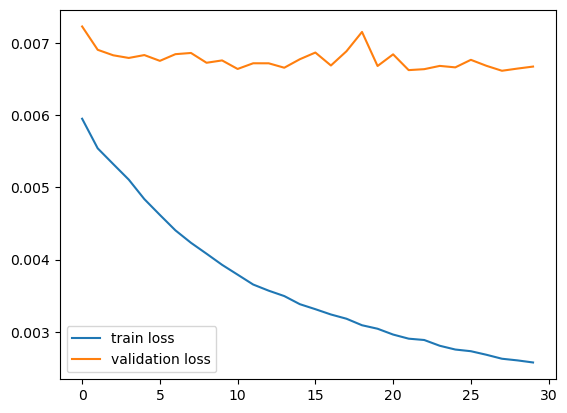

In [63]:
plt.plot(Loss_train)
plt.plot(Loss_val)
plt.legend(("train loss", "validation loss"))
plt.show()

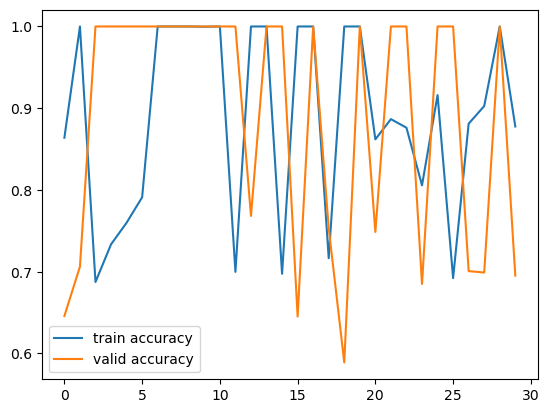

In [64]:
plt.plot(torch.tensor(Acc_train).cpu().detach().numpy())
plt.plot(torch.tensor(Acc_val).cpu().detach().numpy())
plt.legend(("train accuracy", "valid accuracy"))
plt.show()

## Model eval

In [40]:
model = torch.load("./Dong_model5")

C:\ProgramData\Anaconda3\envs\Image_processing\lib\site-packages\torchvision\io\image.py:11: UserWarning: Failed to load image Python extension: [WinError 126] The specified module could not be found
  warn(f"Failed to load image Python extension: {e}")


In [65]:
xval.shape

(185, 3, 320, 320)

In [104]:
torch.cuda.empty_cache()            
model.cuda()
def pred(dat):
    st = time.time()
    with torch.no_grad():
        pre = model(dat)
    end = time.time()
    print(end-st)
    return(pre)

outputs = pred(torch.from_numpy(xval).cuda()) #X_train[:22] [40:80][80:120] [120:165]
pred = torch.transpose(outputs, 3,1)
o = torch.transpose(torch.from_numpy(xval).cuda(), 3,1) #X_train[:22]
yo = torch.transpose(torch.from_numpy(yval).cuda(), 3,1)

18.234989404678345


In [105]:
dice(torch.round(outputs), torch.from_numpy(yval).cuda())

tensor(0.6073, device='cuda:0')

In [106]:
iou_pytorch(torch.round(outputs), torch.from_numpy(yval).cuda())

tensor(0.5656, device='cuda:0')

In [107]:
ssim(torch.round(outputs), torch.from_numpy(yval).cuda(), data_range=1, size_average=True)

tensor(0.9859, device='cuda:0')

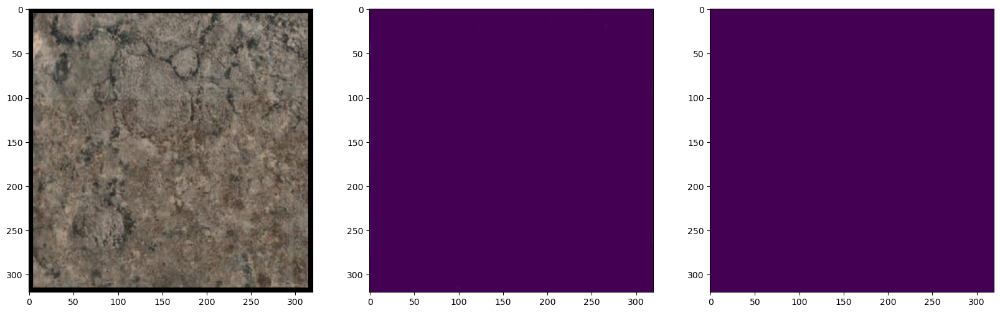

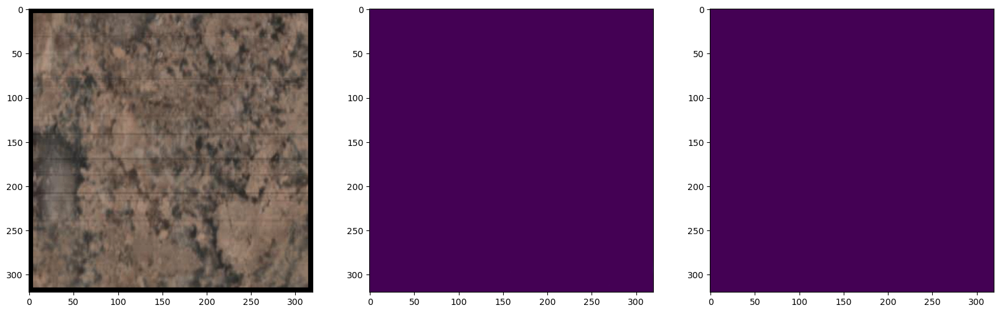

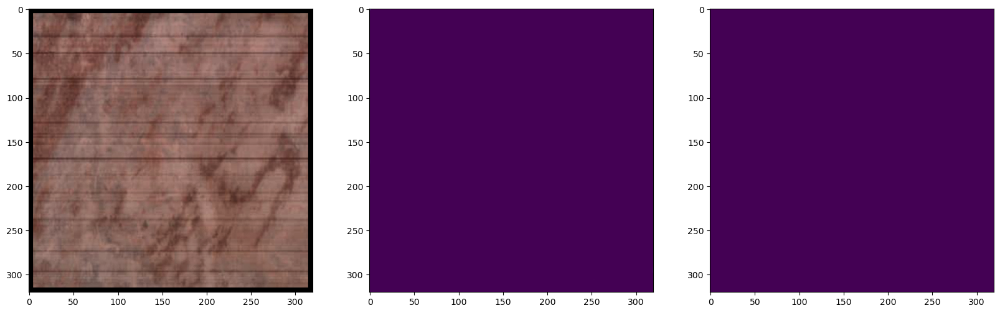

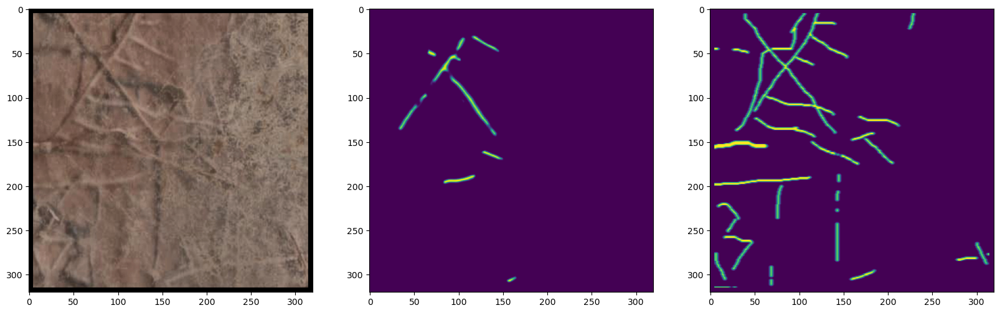

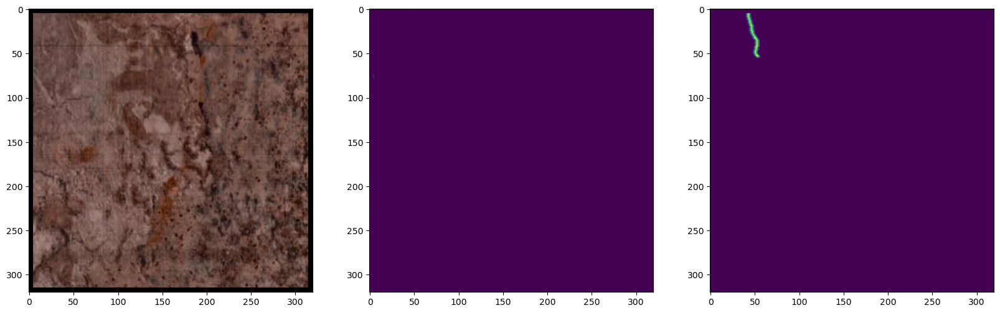

...

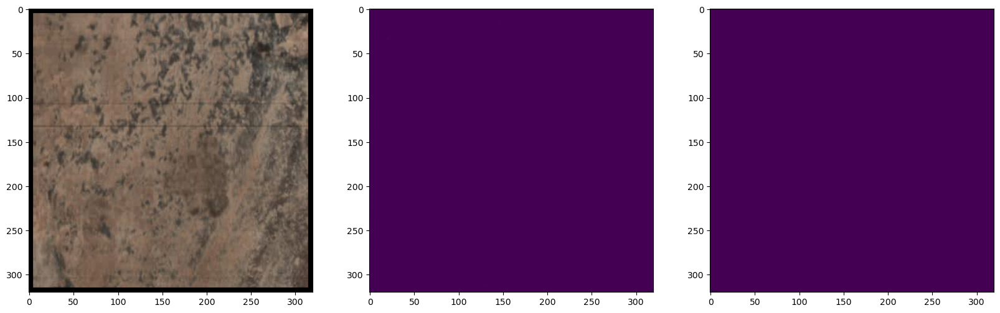

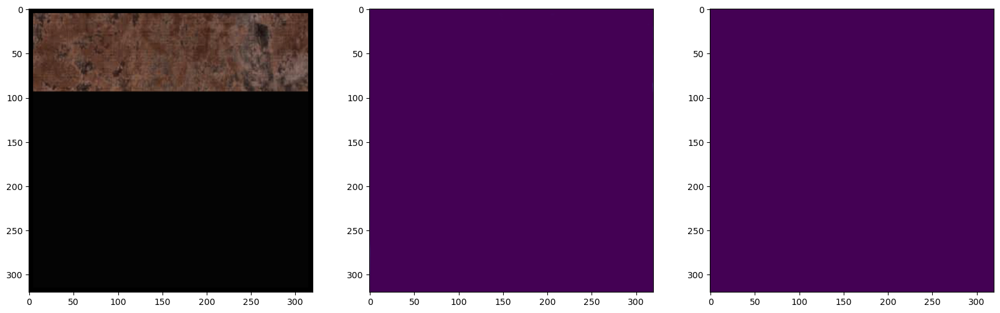

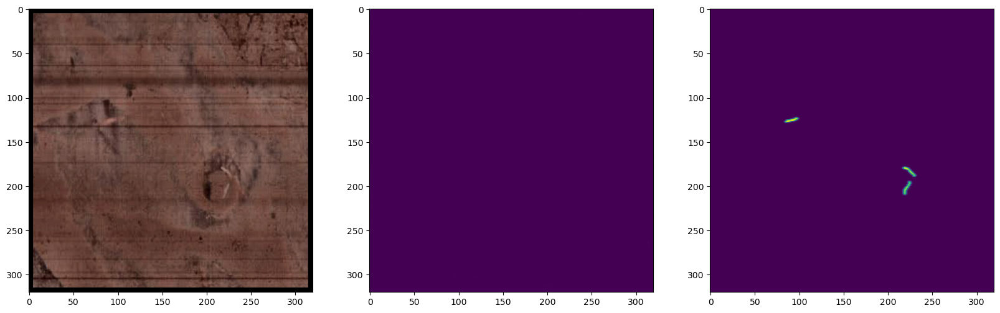

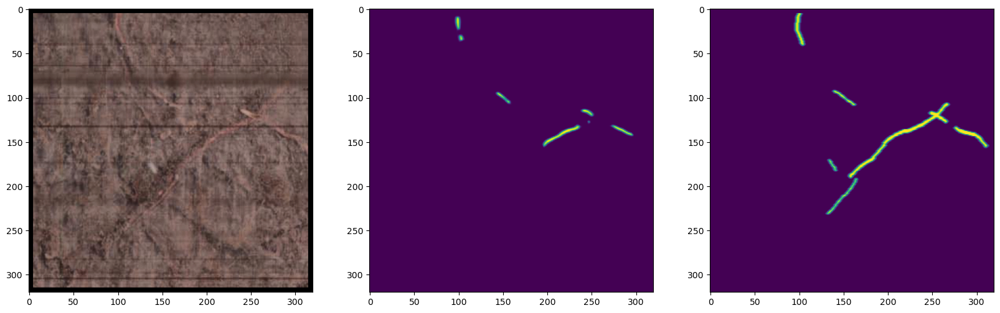

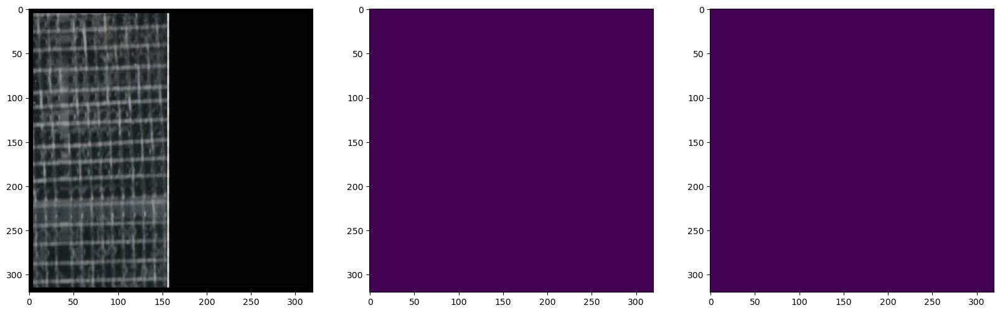

In [70]:
for i in range(100,120):
    figure(figsize=(20,20))
    plt.subplot(1, 3, 1)
    plt.imshow(o[i,:,:,:].cpu().detach().numpy())
    plt.subplot(1, 3, 2)
    plt.imshow(pred[i,:,:,0].cpu().detach().numpy())
    plt.subplot(1, 3, 3)
    #plt.imshow(new_train_y[i,0,:,:])
    plt.imshow(yo[i,:,:,0].cpu().detach().numpy())
    plt.show()

## Model prediction on test data

In [71]:
#dir0 = "natural_forest_2023_Jan/4test/"
dir0 = "数据/"
l = os.listdir(dir0)

In [72]:
l

['data.xlsx',
 'results.xlsx',
 '峨眉山_T019_L001_21.04.22_134350_012_戚.jpg',
 '峨眉山_T019_L001_21.04.22_134350_012_戚.pa2',
 '峨眉山_T019_L002_21.04.22_134605_012_戚.jpg',
 '峨眉山_T019_L002_21.04.22_134605_012_戚.pa2',
 '峨眉山_T019_L003_21.04.22_134808_012_戚.jpg',
 '峨眉山_T019_L003_21.04.22_134808_012_戚.pa2',
 '峨眉山_T019_L004_21.04.22_134952_012_戚.jpg',
 '峨眉山_T019_L004_21.04.22_134952_012_戚.pa2',
 '峨眉山_T020_L001_21.04.22_135235_012_戚.jpg',
 '峨眉山_T020_L001_21.04.22_135235_012_戚.pa2',
 '峨眉山_T020_L002_21.04.22_135423_012_戚.jpg',
 '峨眉山_T020_L002_21.04.22_135423_012_戚.pa2',
 '峨眉山_T031_L001_21.04.22_120219_012_戚.jpg',
 '峨眉山_T031_L001_21.04.22_120219_012_戚.pa2',
 '峨眉山_T031_L002_21.04.22_120431_012_戚.jpg',
 '峨眉山_T031_L002_21.04.22_120431_012_戚.pa2',
 '峨眉山_T031_L003_21.04.22_120646_012_戚.jpg',
 '峨眉山_T031_L003_21.04.22_120646_012_戚.pa2',
 '峨眉山_T031_L004_21.04.22_120854_012_戚.jpg',
 '峨眉山_T031_L004_21.04.22_120854_012_戚.pa2']

In [73]:
jpg_filenames = []

In [74]:
# Images
X = np.zeros(shape=(1,310,310,3), dtype="uint8")
for i in l:
    if i.lower().endswith(".jpg"):
        jpg_filenames.append(i)
        img = Image.open(dir0+i)
        I = patches(img)
        x=np.array(I)
        X = np.append(X, x, axis=0)
X = X[1:]
X.shape 

(560, 310, 310, 3)

In [75]:
X = apply_clahe_to_batch(X)

In [78]:
X_ = transcal(X)
X_.shape

(560, 3, 310, 310)

In [101]:
model = torch.load("./Dong_model5.2")

In [79]:
def predict_mask(Model,dat):
    out=torch.tensor([])
    for i in range(0,dat.shape[0],1):
        torch.cuda.empty_cache() 
        j=i+1
        #print(j)
        if j==(dat.shape[0]+1):
            print(j)
            with torch.no_grad():
                outputs = Model(torch.from_numpy(dat[i:]).cuda()) 
            out = torch.cat((out,outputs.cpu()),0)
        else:
            with torch.no_grad():
                outputs = Model(torch.from_numpy(dat[i:j]).cuda()) 
            out = torch.cat((out,outputs.cpu()),0)
    out = out.cpu().detach().numpy()
    return out

In [80]:
X_ = padding(X_, "x")

In [81]:
X_.dtype

dtype('float32')

In [82]:
#X_= X_.astype(np.float32)
X_.shape

(560, 3, 320, 320)

In [109]:
out = predict_mask(model,X_)

In [86]:
def ensemble_masks(models, data):
    """
    Predicts segmentation masks using multiple models and returns their clipped sum.
    
    Parameters:
        models (list): List of models to use for prediction.
        data: Input data for prediction (e.g., image or batch of images).
        
    Returns:
        np.ndarray: Clipped sum of predicted masks (max pixel value = 1.0).
    """
    total_mask = None
    
    for model in models:
        out = predict_mask(model, data)
        if total_mask is None:
            total_mask = out
        else:
            total_mask += out
    
    # Clip values to a maximum of 1.0
    total_mask = np.clip(total_mask, 0, 1.0)
    
    return total_mask


In [87]:
out = ensemble_masks([model2, model3], X_)

In [110]:
def depadding(padded_dat, depad_size=5, n="y"):
    m = []
    for i in range(padded_dat.shape[0]):
        if n == "y":
            # Remove padding for the first channel (index 0) when n == "y"
            m.append(padded_dat[i, 0, depad_size:-depad_size, depad_size:-depad_size])
        else:
            n_depad = []
            for j in range(3):
                # Remove padding for each of the 3 channels (when n != "y")
                n_depad.append(padded_dat[i, j, depad_size:-depad_size, depad_size:-depad_size])
            m.append(n_depad)
    return np.array(m)

In [111]:
out_ = depadding(out)
out_.shape

(560, 310, 310)

In [112]:
out_ = np.expand_dims(out_,axis=3)
out_ = out_.transpose(0,3,1,2)
out_.shape

(560, 1, 310, 310)

In [113]:
out = reverse_transcal(out_,0,255)
#Y = reverse_transcal(Y,0,255)

In [114]:
out.shape

(560, 310, 310, 1)

In [115]:
out = np.tile(out, (1, 1, 1, 3))
out.shape

(560, 310, 310, 3)

In [75]:
Y = reverse_transcal(Y,0,255)
Y.shape

(79, 320, 1, 320)

In [76]:
# reverse the size and join the fragments together
Y = np.tile(Y, (1, 1, 1, 3))
Y.shape

(79, 320, 1, 960)

In [77]:
reconstructed_images = extract_and_reconstruct_all(Y, (2550, 2273))

TypeError: Cannot handle this data type: (1, 1, 960), |u1

In [116]:
reconstructed_images2 = extract_and_reconstruct_all(out, (2550, 2273))

In [117]:
reconstructed_images2

[<PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>]

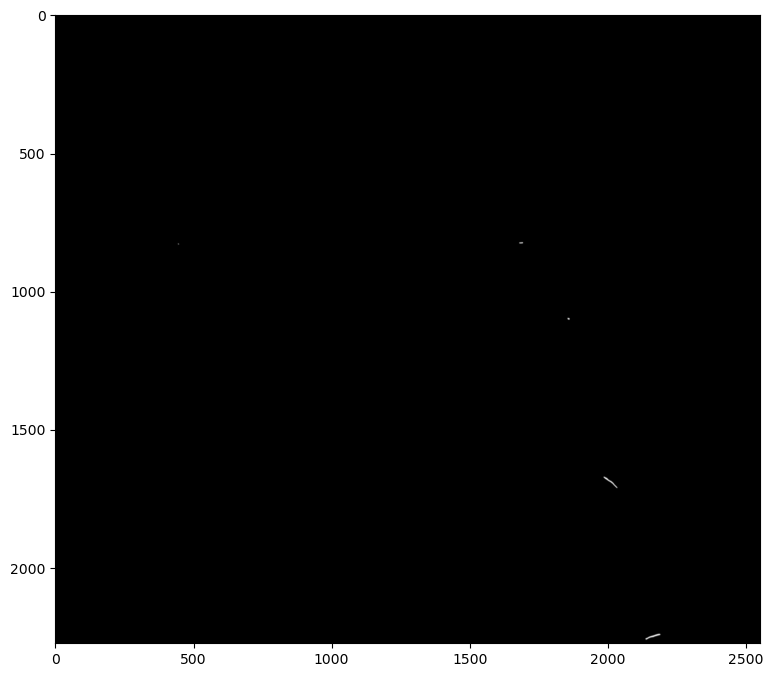

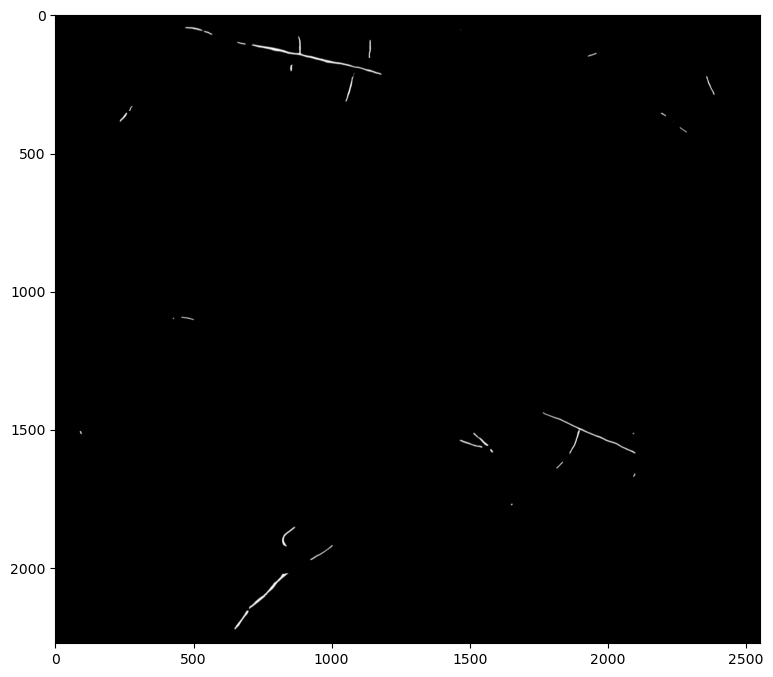

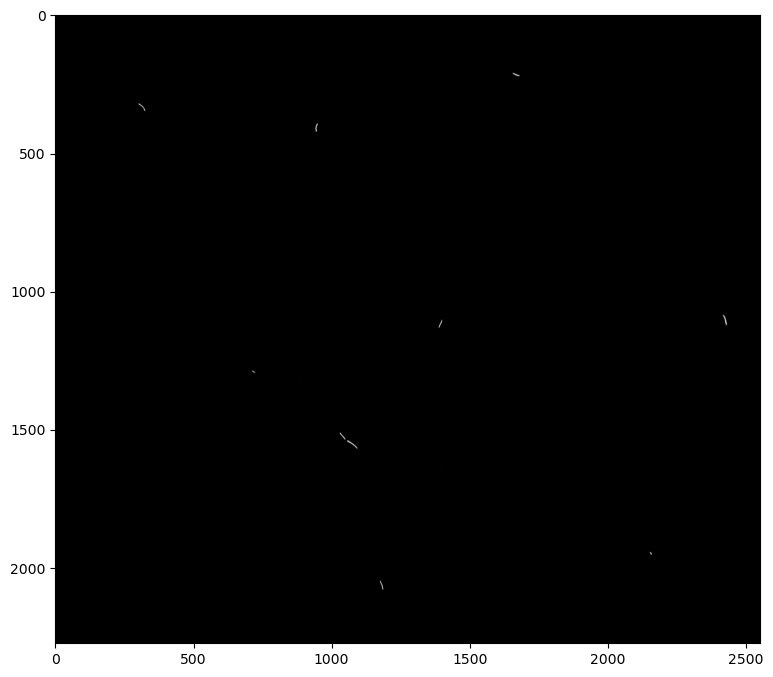

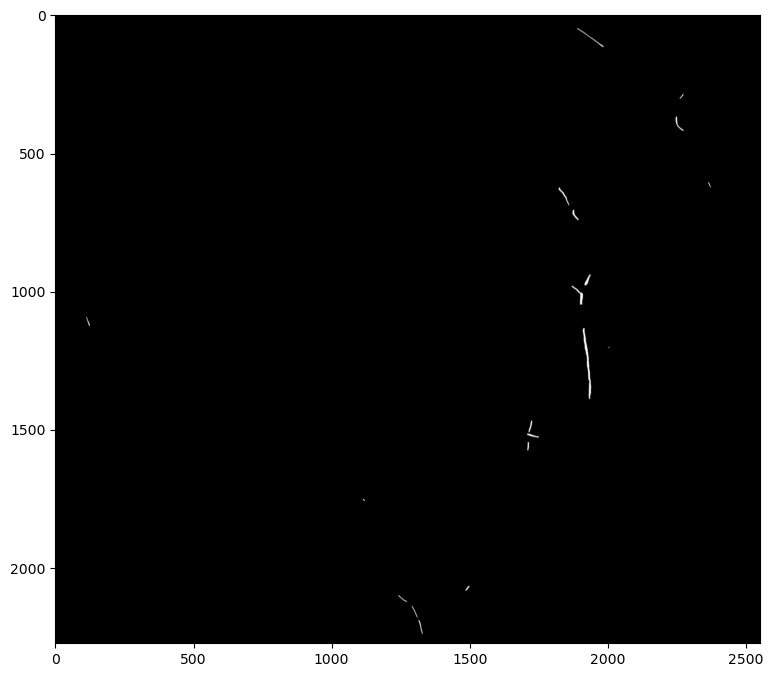

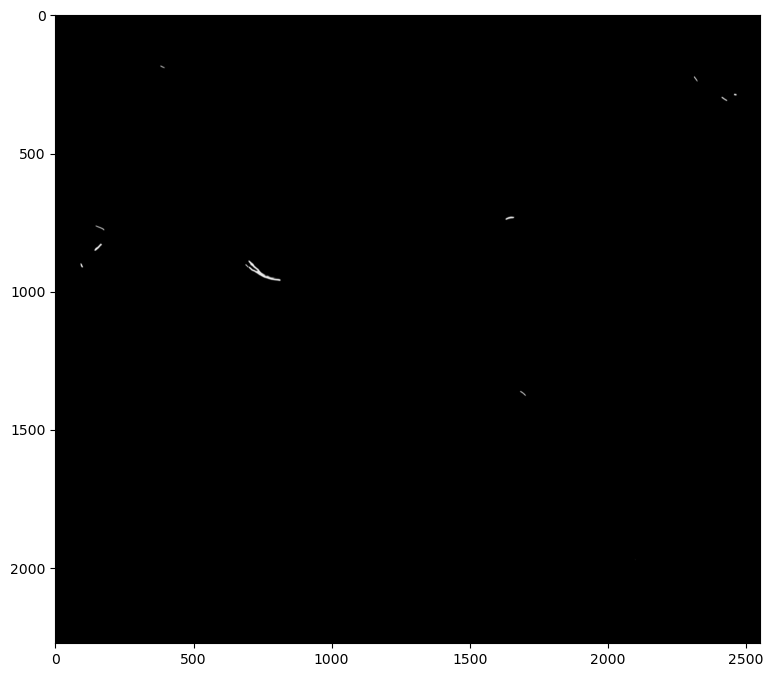

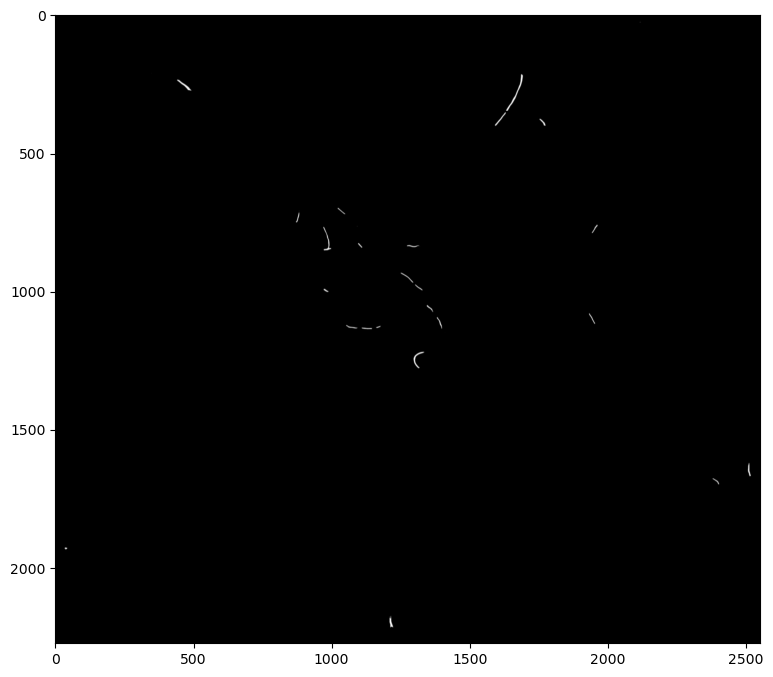

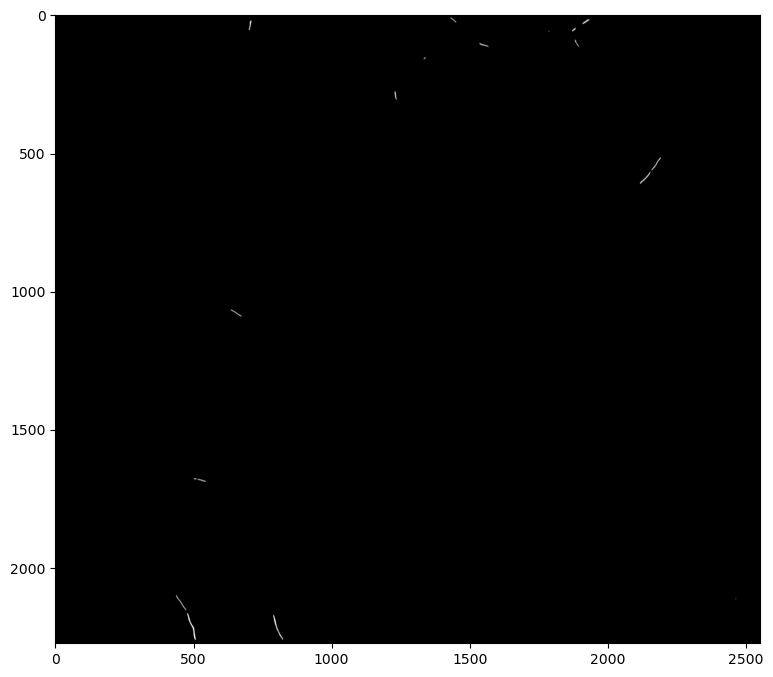

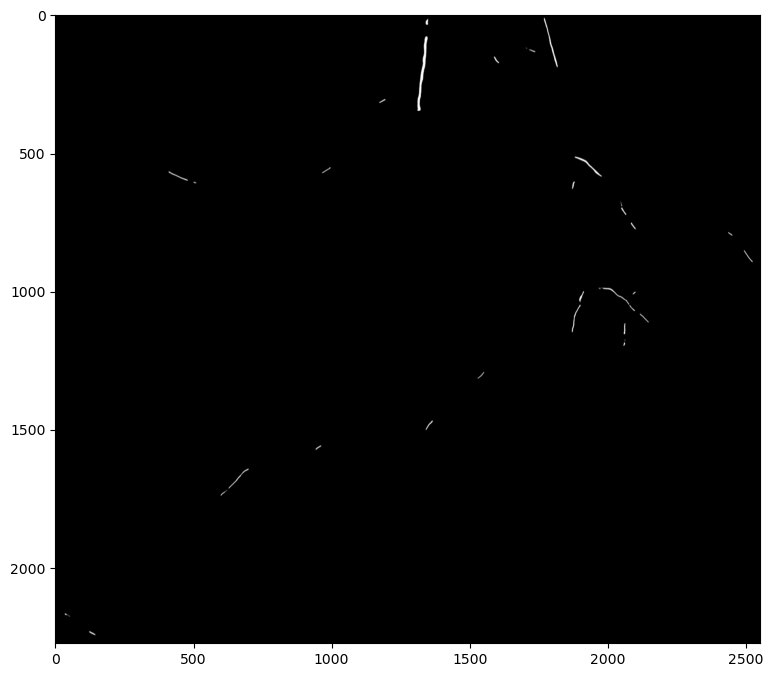

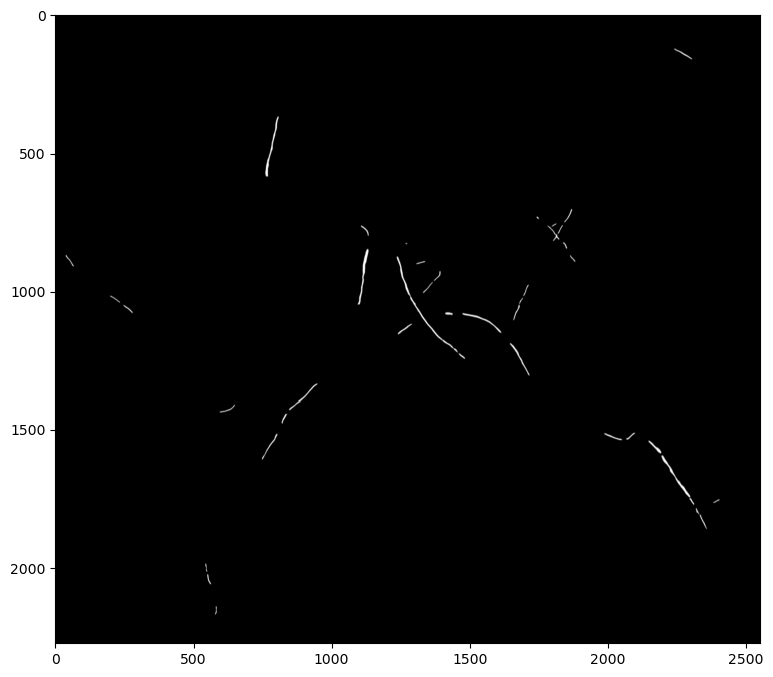

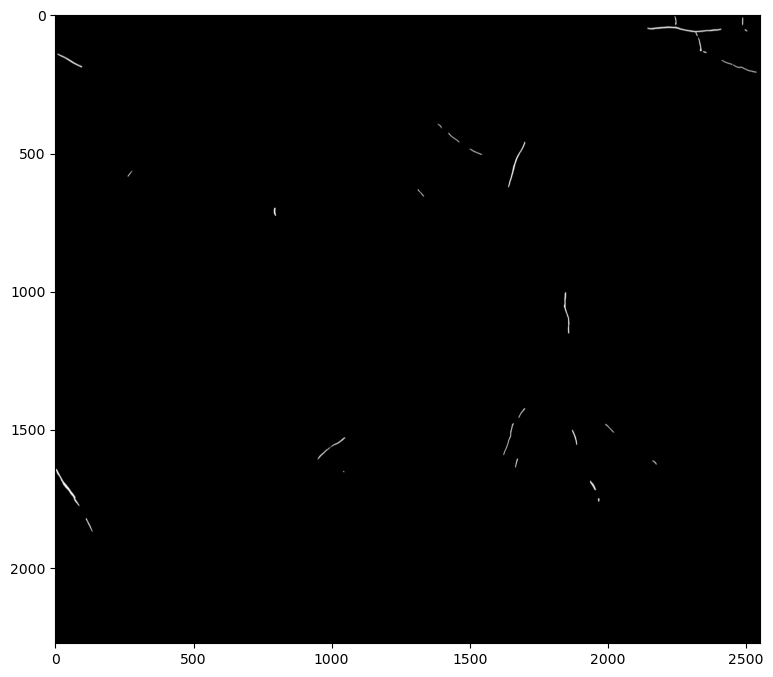

In [92]:
# testing files model 6
for i in range(len(reconstructed_images2)):
    figure(figsize=(20,20))
    plt.subplot(1, 2, 1)
    plt.imshow(reconstructed_images2[i])

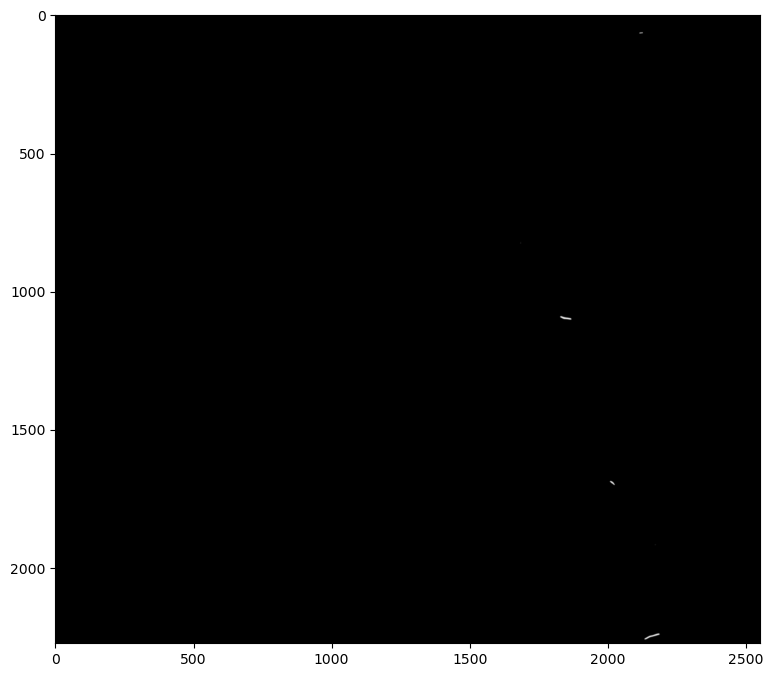

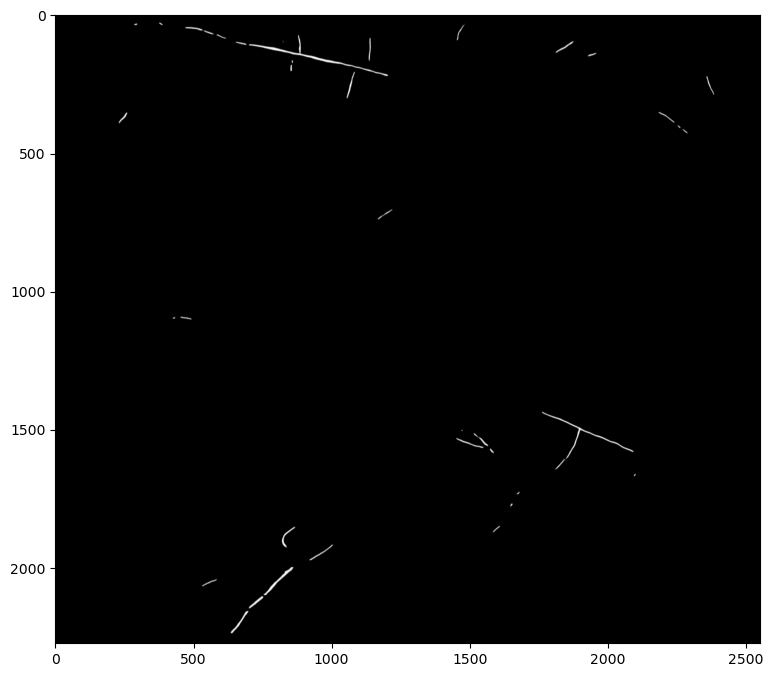

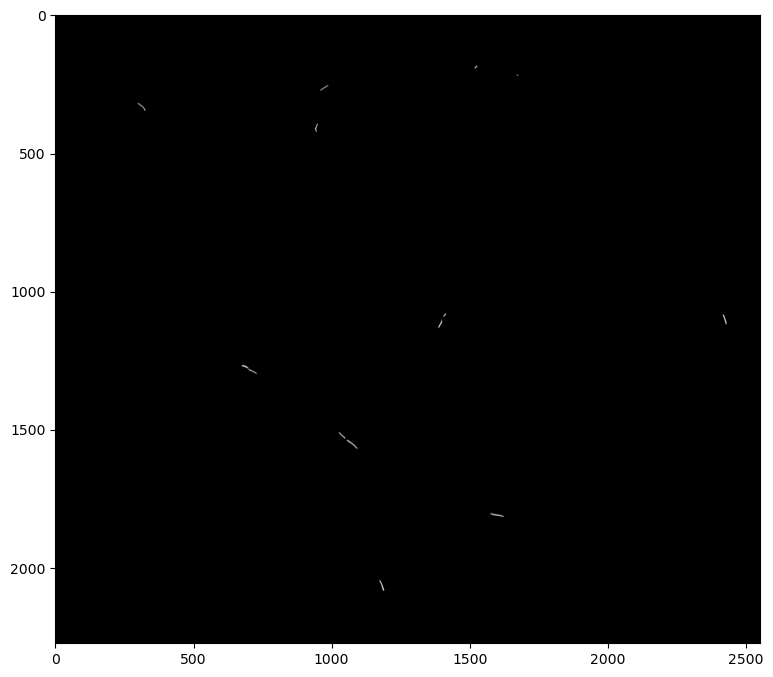

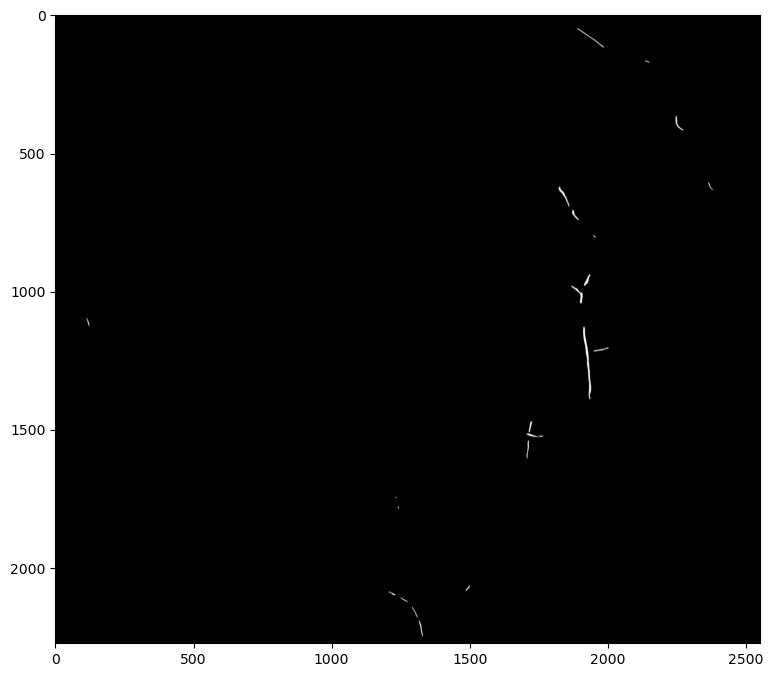

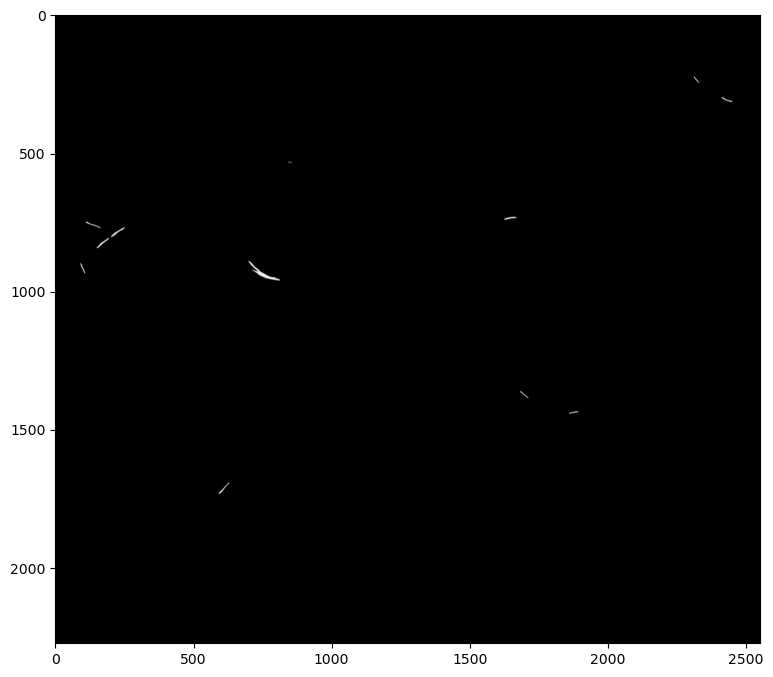

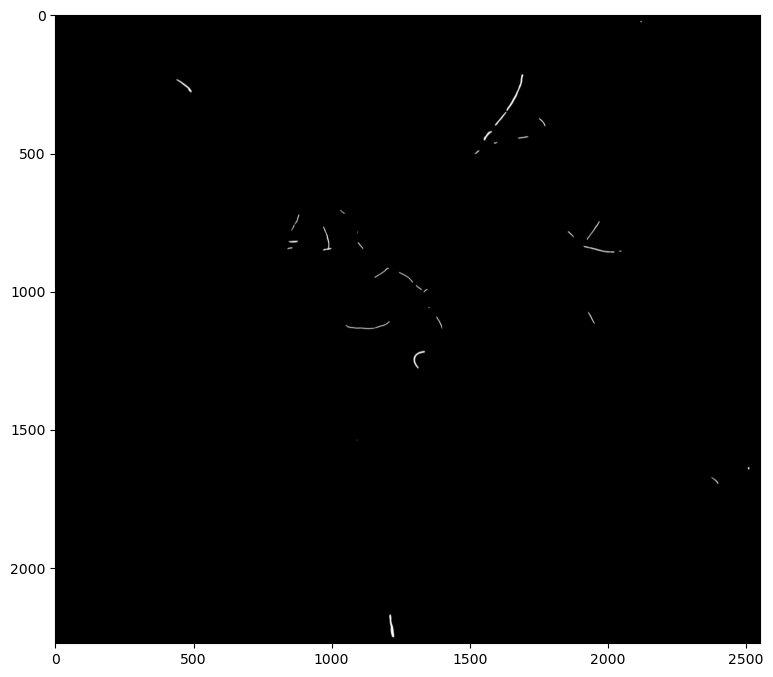

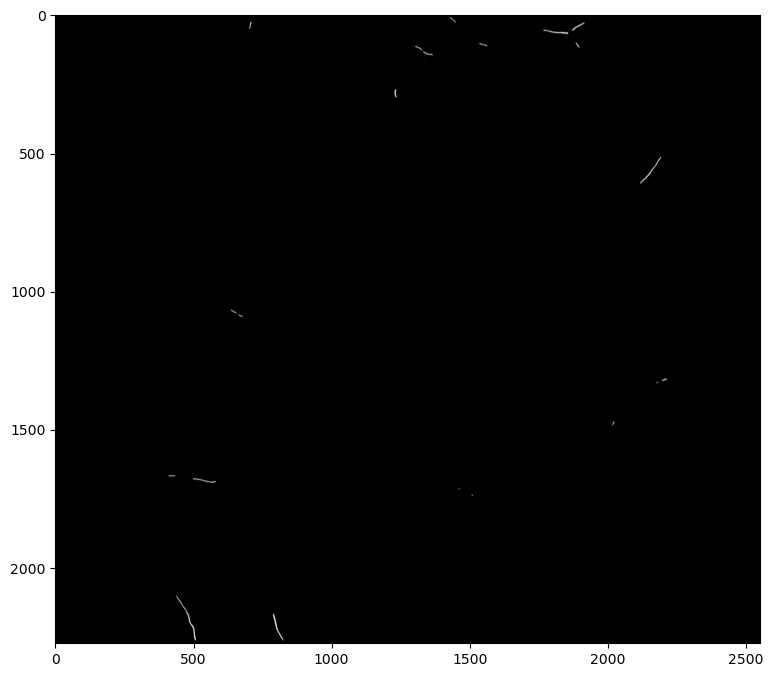

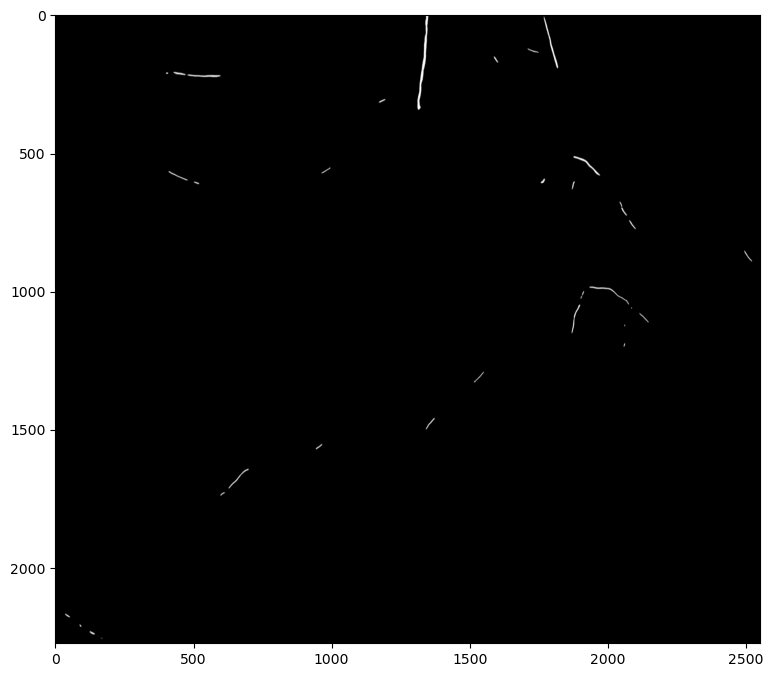

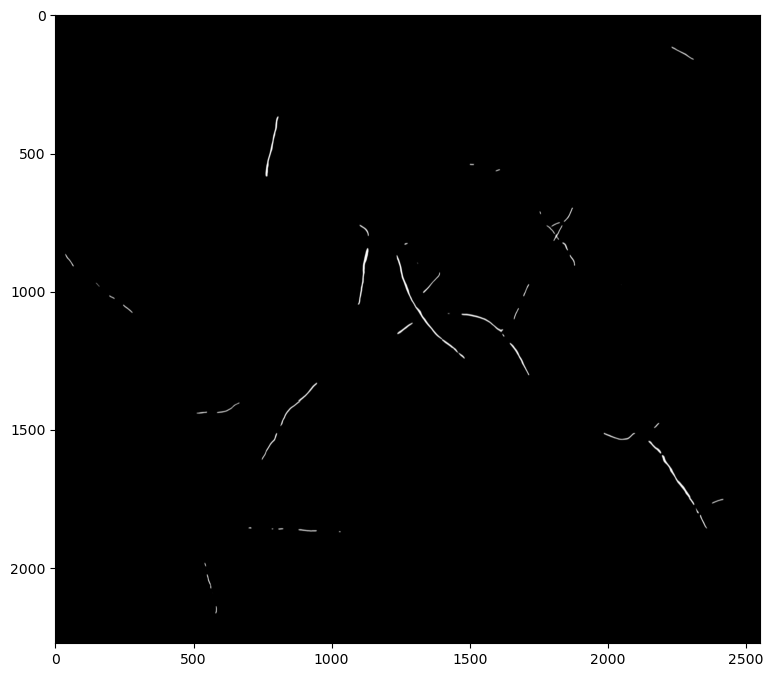

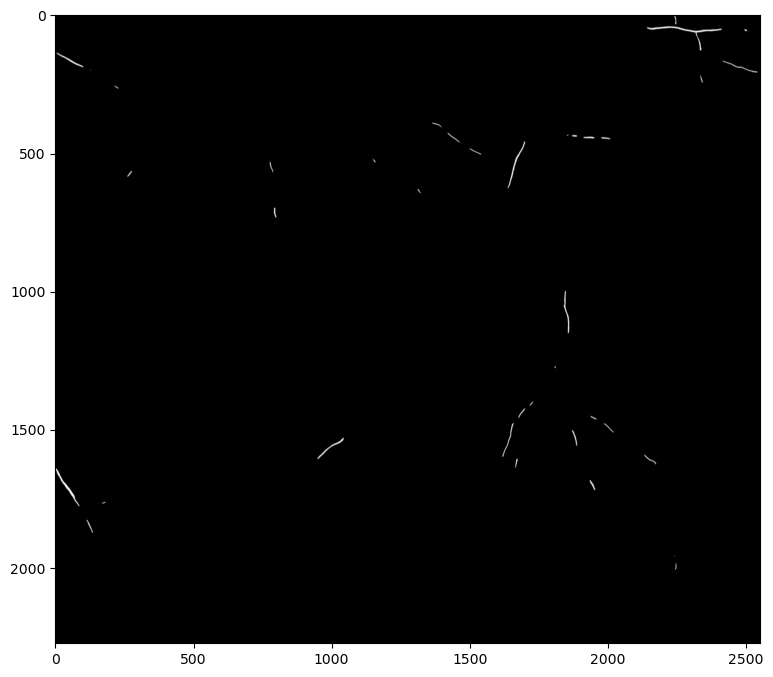

In [118]:
# testing files model 5.3
for i in range(len(reconstructed_images2)):
    figure(figsize=(20,20))
    plt.subplot(1, 2, 1)
    plt.imshow(reconstructed_images2[i])

### Skeletonization

In [93]:
from skimage import img_as_bool, color, morphology
import numpy as np

def compute_skeleton_sums(image_list):
    skeleton_sums = []
    for img in image_list:
        # Convert image to grayscale and then to boolean
        gray = color.rgb2gray(np.array(img))  # ensure it's a NumPy array
        binary = img_as_bool(gray)
        
        # Apply medial axis skeletonization
        skeleton = morphology.medial_axis(binary)
        
        # Sum the skeleton pixels (True = 1)
        skeleton_sums.append(skeleton.sum())
    
    return skeleton_sums


In [73]:
# model 5.2
sums = compute_skeleton_sums(reconstructed_images2)
print(sums)

[120, 2540, 385, 1096, 543, 1398, 833, 1716, 2852, 1991]


In [94]:
# model 6
sums = compute_skeleton_sums(reconstructed_images2)
print(sums)

[128, 2077, 260, 955, 361, 999, 592, 1457, 2612, 1724]


In [119]:
# model 5.3
sums = compute_skeleton_sums(reconstructed_images2)
print(sums)

[124, 2553, 389, 1100, 533, 1425, 850, 1741, 2865, 2000]


In [95]:
jpg_filenames

['峨眉山_T019_L001_21.04.22_134350_012_戚.jpg',
 '峨眉山_T019_L002_21.04.22_134605_012_戚.jpg',
 '峨眉山_T019_L003_21.04.22_134808_012_戚.jpg',
 '峨眉山_T019_L004_21.04.22_134952_012_戚.jpg',
 '峨眉山_T020_L001_21.04.22_135235_012_戚.jpg',
 '峨眉山_T020_L002_21.04.22_135423_012_戚.jpg',
 '峨眉山_T031_L001_21.04.22_120219_012_戚.jpg',
 '峨眉山_T031_L002_21.04.22_120431_012_戚.jpg',
 '峨眉山_T031_L003_21.04.22_120646_012_戚.jpg',
 '峨眉山_T031_L004_21.04.22_120854_012_戚.jpg']

### Overlay mask on original image

In [96]:
def load_original_images(filenames, base_dir):
    """
    Loads and returns images from a list of filenames within a base directory.
    
    Args:
        filenames (list): List of image filenames.
        base_dir (str): Directory where images are located.

    Returns:
        List of PIL.Image objects, in the same order as the filenames.
    """
    images = []
    for fname in filenames:
        path = os.path.join(base_dir, fname)
        if os.path.isfile(path):
            try:
                img = Image.open(path).convert("RGB")
                images.append(img)
            except Exception as e:
                print(f"Error loading {fname}: {e}")
        else:
            print(f"File not found: {fname}")
    return images


from PIL import Image, ImageEnhance

import numpy as np
from PIL import Image

def overlay_mask_on_image(original_img, mask, alpha=0.5, colormap=(255, 0, 0)):
    """
    Overlays a binary/grayscale/RGB mask over the original image.
    Handles PIL or NumPy input for both original image and mask.
    """
    print("Convert original image to PIL.Image if needed") 
    if isinstance(original_img, np.ndarray):
        original_img = Image.fromarray(original_img).convert("RGB")
    else:
        original_img = original_img.convert("RGB")

    print("Convert mask to NumPy array if it's a PIL Image") 
    if isinstance(mask, Image.Image):
        mask = np.array(mask)

    print("Convert RGB mask to grayscale if needed") 
    if mask.ndim == 3:
        if mask.shape[2] == 1:
            mask = mask[:, :, 0]
        elif mask.shape[2] == 3:
            # Average the RGB channels
            mask = np.mean(mask, axis=2).astype(np.uint8)
        else:
            raise ValueError(f"Unsupported mask shape: {mask.shape}")

    print("Resize mask to match image") 
    mask_img = Image.fromarray(np.uint8(mask)).resize(original_img.size)
    mask_img = mask_img.convert("L")  # grayscale mask

    print("Create solid color overlay") 
    color_mask = Image.new("RGB", original_img.size, colormap)

    print("Apply mask and blend") 
    composite = Image.composite(color_mask, original_img, mask_img.point(lambda x: 255 if x > 0 else 0))
    blended = Image.blend(original_img, composite, alpha)

    return blended

In [97]:
originals = load_original_images(l, dir0)

Error loading data.xlsx: cannot identify image file '数据/data.xlsx'
Error loading results.xlsx: cannot identify image file '数据/results.xlsx'
Error loading 峨眉山_T019_L001_21.04.22_134350_012_戚.pa2: cannot identify image file '数据/峨眉山_T019_L001_21.04.22_134350_012_戚.pa2'
Error loading 峨眉山_T019_L002_21.04.22_134605_012_戚.pa2: cannot identify image file '数据/峨眉山_T019_L002_21.04.22_134605_012_戚.pa2'
Error loading 峨眉山_T019_L003_21.04.22_134808_012_戚.pa2: cannot identify image file '数据/峨眉山_T019_L003_21.04.22_134808_012_戚.pa2'
Error loading 峨眉山_T019_L004_21.04.22_134952_012_戚.pa2: cannot identify image file '数据/峨眉山_T019_L004_21.04.22_134952_012_戚.pa2'
Error loading 峨眉山_T020_L001_21.04.22_135235_012_戚.pa2: cannot identify image file '数据/峨眉山_T020_L001_21.04.22_135235_012_戚.pa2'
Error loading 峨眉山_T020_L002_21.04.22_135423_012_戚.pa2: cannot identify image file '数据/峨眉山_T020_L002_21.04.22_135423_012_戚.pa2'
Error loading 峨眉山_T031_L001_21.04.22_120219_012_戚.pa2: cannot identify image file '数据/峨眉山_T031_L00

In [98]:
originals

[<PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>,
 <PIL.Image.Image image mode=RGB size=2550x2273>]

In [100]:
for idx in range(10):
    img = originals[idx]
    mask = reconstructed_images2[idx]  # Should match the full original image size

    overlay = overlay_mask_on_image(img, mask)
    overlay.show()

Convert original image to PIL.Image if needed
Convert mask to NumPy array if it's a PIL Image
Convert RGB mask to grayscale if needed
Resize mask to match image
Create solid color overlay
Apply mask and blend
Convert original image to PIL.Image if needed
Convert mask to NumPy array if it's a PIL Image
Convert RGB mask to grayscale if needed
Resize mask to match image
Create solid color overlay
Apply mask and blend
Convert original image to PIL.Image if needed
Convert mask to NumPy array if it's a PIL Image
Convert RGB mask to grayscale if needed
Resize mask to match image
Create solid color overlay
Apply mask and blend
Convert original image to PIL.Image if needed
Convert mask to NumPy array if it's a PIL Image
Convert RGB mask to grayscale if needed
Resize mask to match image
Create solid color overlay
Apply mask and blend
Convert original image to PIL.Image if needed
Convert mask to NumPy array if it's a PIL Image
Convert RGB mask to grayscale if needed
Resize mask to match image
Cre

In [82]:
for idx in range(len(reconstructed_images2)):
    img = originals[idx]
    mask = reconstructed_images2[idx]
    overlay = overlay_mask_on_image(img, mask)

    filename = f"overlay_test_{idx}.jpg"
    save_path = os.path.join(os.path.expanduser("~"), "Downloads", filename)
    overlay.save(save_path, format="JPEG")
    print(f"Saved: {save_path}")

Convert original image to PIL.Image if needed
Convert mask to NumPy array if it's a PIL Image
Convert RGB mask to grayscale if needed
Resize mask to match image
Create solid color overlay
Apply mask and blend
Saved: C:\Users\Pavel Baykalov\Downloads\overlay_test_0.jpg
Convert original image to PIL.Image if needed
Convert mask to NumPy array if it's a PIL Image
Convert RGB mask to grayscale if needed
Resize mask to match image
Create solid color overlay
Apply mask and blend
Saved: C:\Users\Pavel Baykalov\Downloads\overlay_test_1.jpg
Convert original image to PIL.Image if needed
Convert mask to NumPy array if it's a PIL Image
Convert RGB mask to grayscale if needed
Resize mask to match image
Create solid color overlay
Apply mask and blend
Saved: C:\Users\Pavel Baykalov\Downloads\overlay_test_2.jpg
Convert original image to PIL.Image if needed
Convert mask to NumPy array if it's a PIL Image
Convert RGB mask to grayscale if needed
Resize mask to match image
Create solid color overlay
Apply

### Overly two masks

In [43]:
def overlay_masks(label_mask, predicted_mask, alpha=0.5):
    # Convert the images to RGBA format to support transparency
    label_mask = label_mask.convert('RGBA')
    predicted_mask = predicted_mask.convert('RGBA')

    # Blend the two images with an alpha value
    blended_image = Image.blend(label_mask, predicted_mask, alpha)

    # Show the blended image
    blended_image.show()

    return blended_image

In [44]:
comparison_image = overlay_masks(reconstructed_images[1], reconstructed_images2[1])

In [145]:
def overlay_masks(label_mask, predicted_mask, alpha=0.5):
    # Convert the label mask to grayscale (binary, assuming label is 255 where mask exists)
    label_mask_np = np.array(label_mask.convert('L'))  # Convert to grayscale
    label_mask_np = np.where(label_mask_np > 0, 255, 0).astype(np.uint8)
    
    # Convert predicted mask to grayscale and binarize (threshold greater than 1)
    predicted_mask_np = np.array(predicted_mask.convert('L'))  # Convert to grayscale
    predicted_mask_np = np.where(predicted_mask_np > 0, 255, 0).astype(np.uint8)  # Binarize (values > 1 become 255)

    # Create an empty RGB image for visualization
    result_image = np.zeros((label_mask_np.shape[0], label_mask_np.shape[1], 3), dtype=np.uint8)

    # Condition 1: Correct predictions (label and prediction overlap) -> Green
    correct_prediction = (label_mask_np == 255) & (predicted_mask_np == 255)
    result_image[correct_prediction] = [0, 255, 0]  # Green for correct predictions

    # Condition 2: Missed predictions (label exists, but prediction is missing) -> Red
    missed_prediction = (label_mask_np == 255) & (predicted_mask_np == 0)
    result_image[missed_prediction] = [255, 0, 0]  # Red for missed predictions

    # Condition 3: False positives (prediction exists, but no label) -> Yellow
    false_positive = (label_mask_np == 0) & (predicted_mask_np == 255)
    result_image[false_positive] = [255, 255, 0]  # Yellow for false positives

    # Convert the result image to PIL format
    result_image_pil = Image.fromarray(result_image)

    # If alpha is set, we will blend with the original predicted mask for transparency
    if alpha < 1:
        # Convert both images to RGBA format
        result_image_pil = result_image_pil.convert('RGBA')
        predicted_mask_rgba = predicted_mask.convert('RGBA')
        
        # Blend the two images using the alpha parameter
        blended_image = Image.blend(result_image_pil, predicted_mask_rgba, alpha)
    else:
        blended_image = result_image_pil

    # Show the blended image
    blended_image.show()

    return blended_image

In [146]:
comparison_image = overlay_masks(reconstructed_images[1], reconstructed_images2[1])

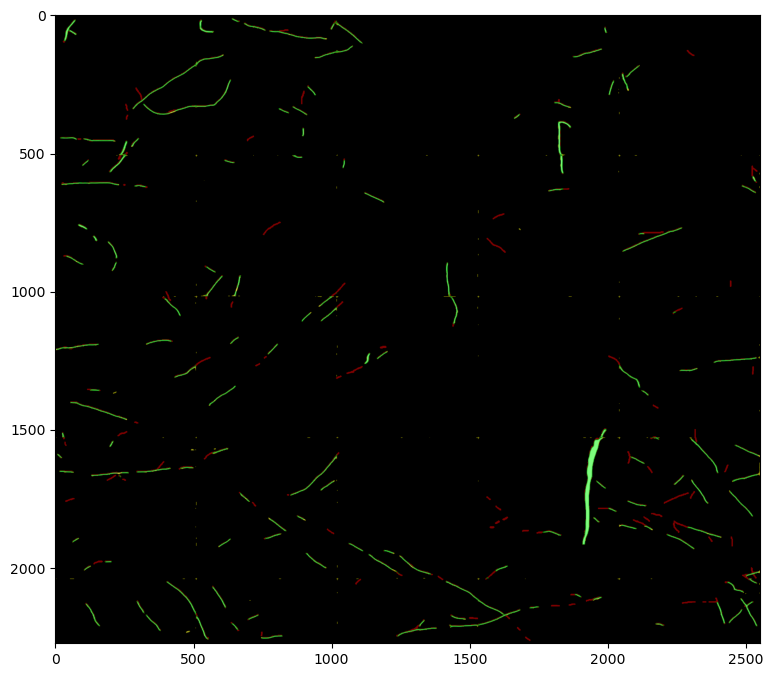

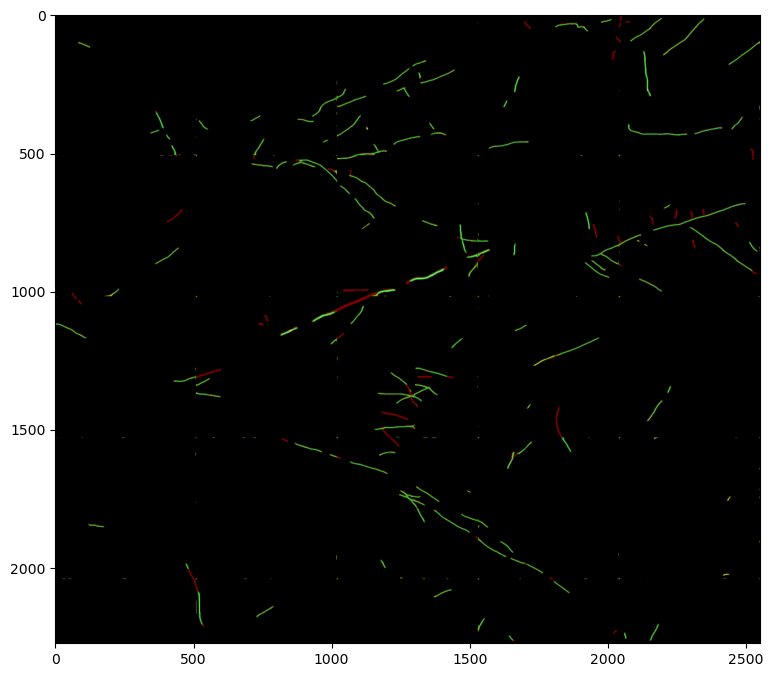

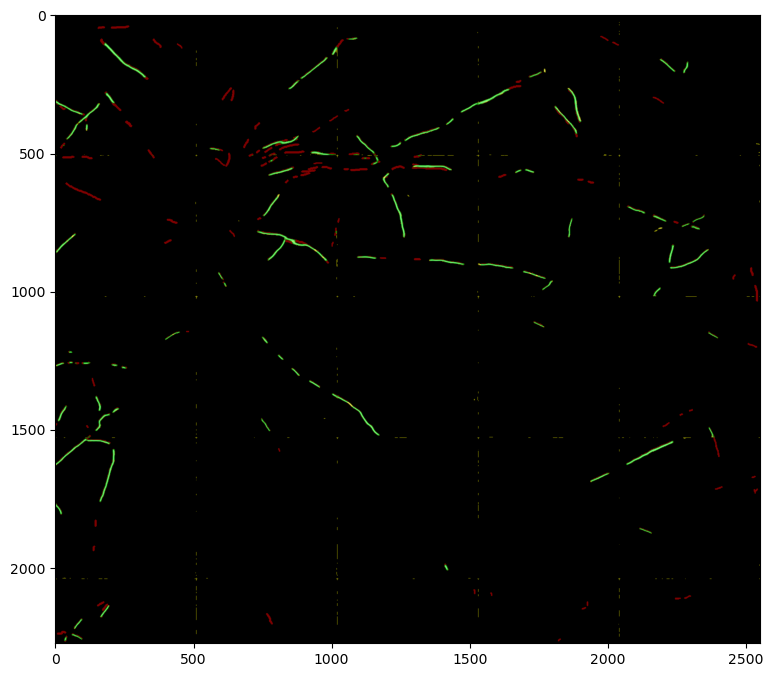

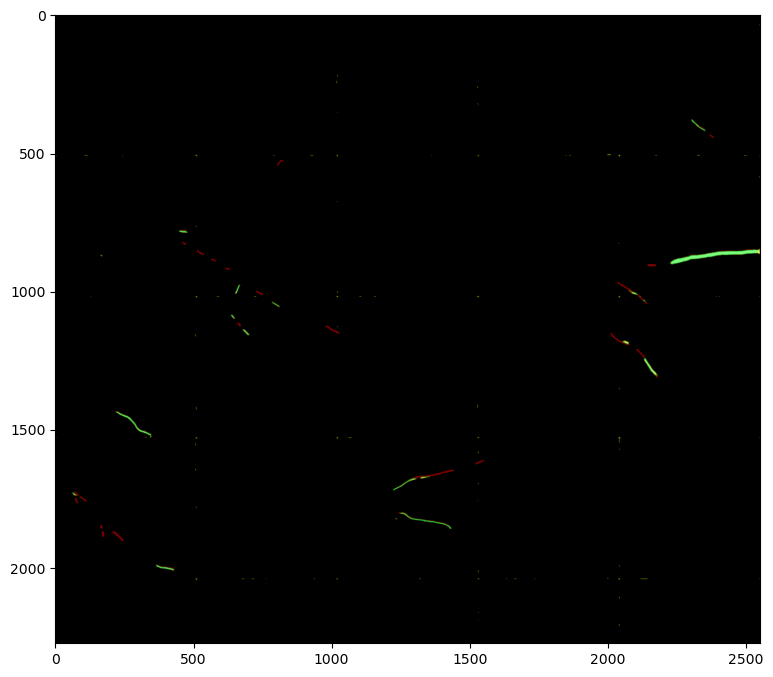

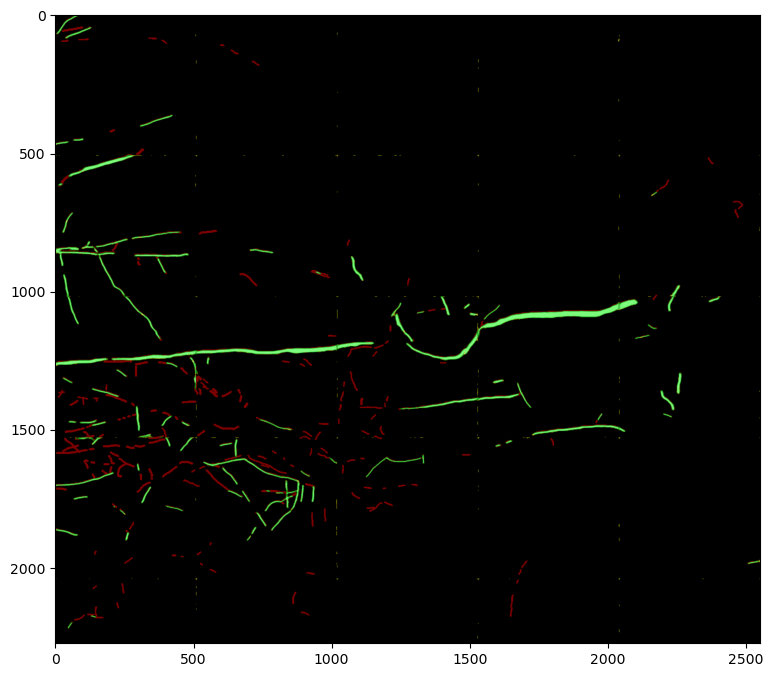

...

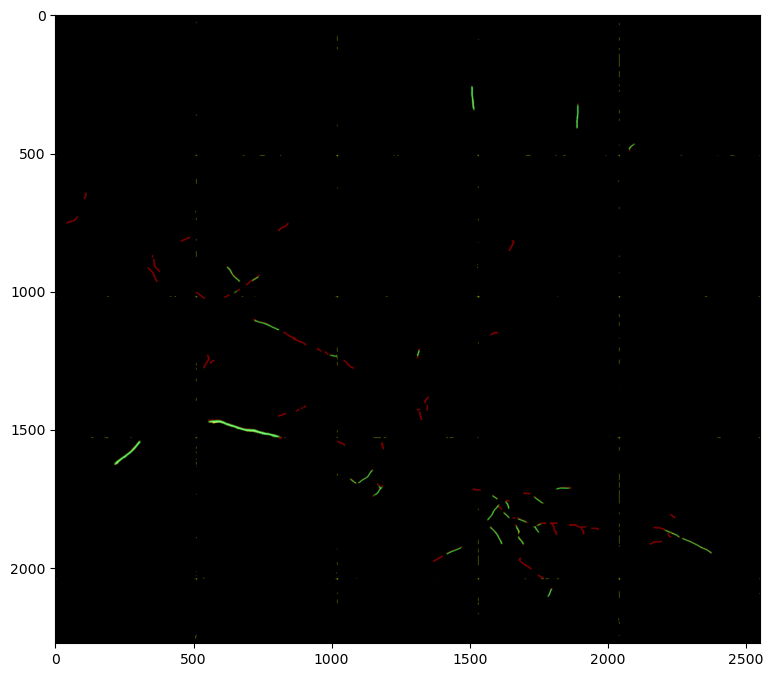

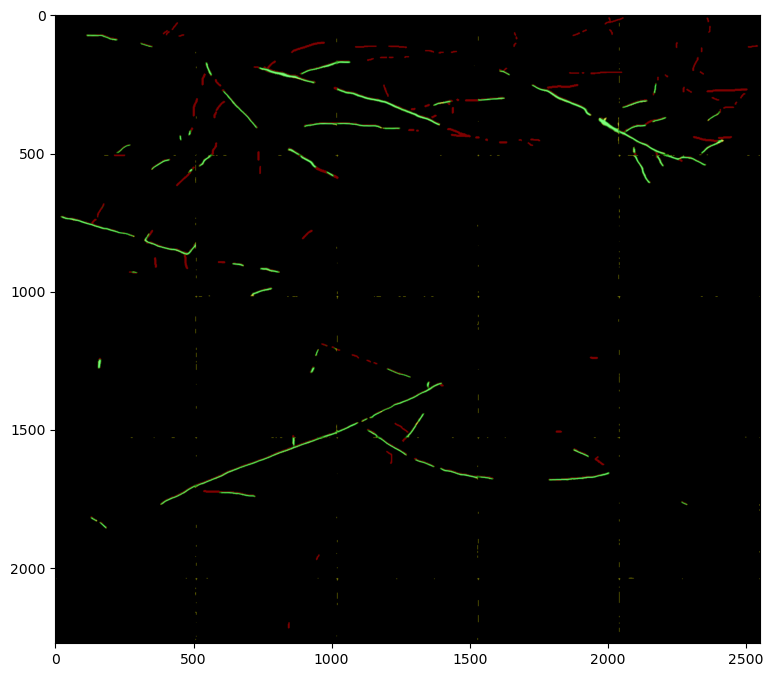

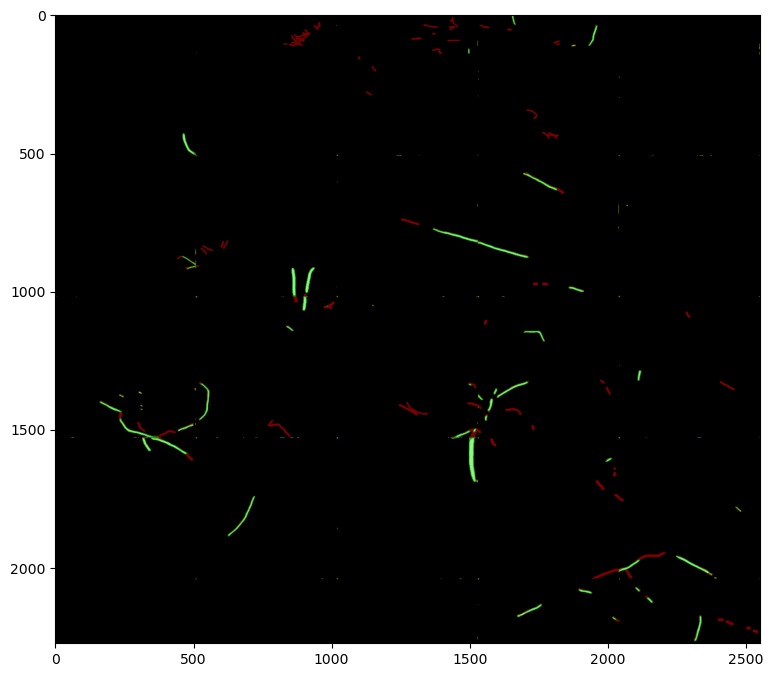

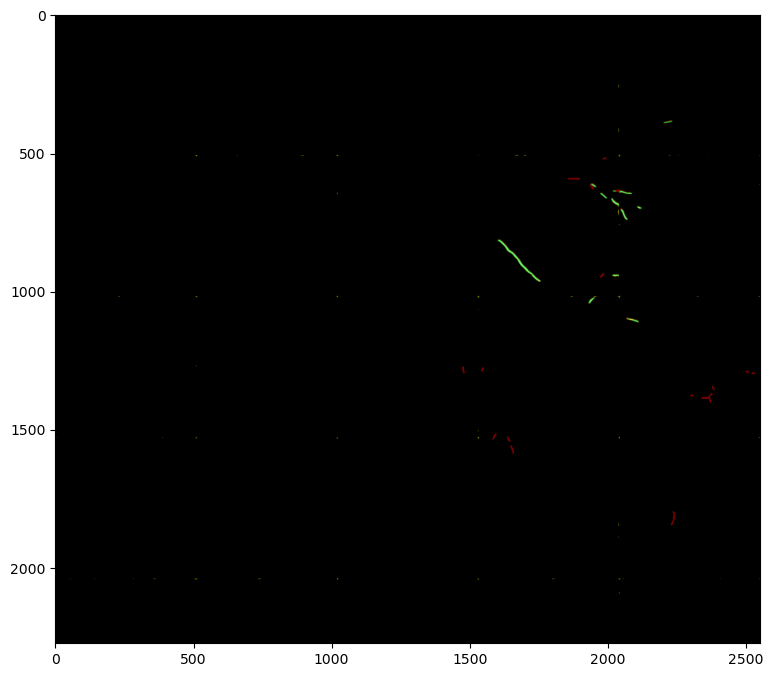

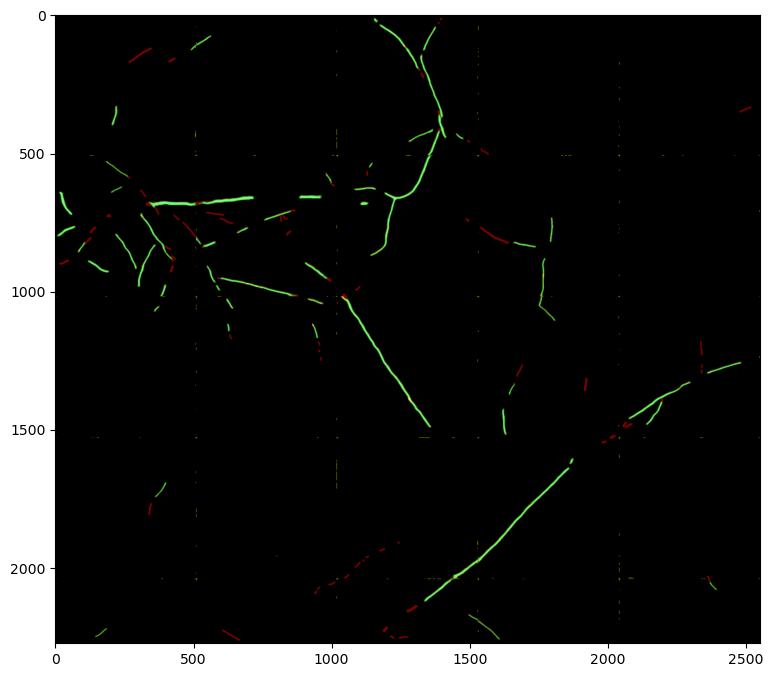

In [72]:
for i in range(len(reconstructed_images2)):
    figure(figsize=(20,20))
    plt.subplot(1, 2, 1)
    plt.imshow(overlay_masks(reconstructed_images[i], reconstructed_images2[i]))

In [51]:
def save_images_with_original_names(images, names_list, directory):
    """
    Save a list of PIL Images to JPG files with modified original names in a specified directory.
    
    :param images: list of PIL Image objects
    :param names_list: list of original image names
    :param directory: directory where images will be saved
    """
    # Ensure the directory exists
    if not os.path.exists(directory):
        os.makedirs(directory)
    
    for idx, img in enumerate(images):
        # Get the original name and modify it
        original_name = names_list[idx]
        name, ext = os.path.splitext(original_name)
        modified_name = f"mask_{name}"
        filepath = os.path.join(directory, modified_name)
        
        # Save the image
        img.save(filepath, "JPEG")

In [ ]:
save_images(reconstructed_images, l, directory="output_masks")